# Projet : Machine Learning et IMEC(Imagerie Macroscopique à Effet Couronne) au service du Vin 

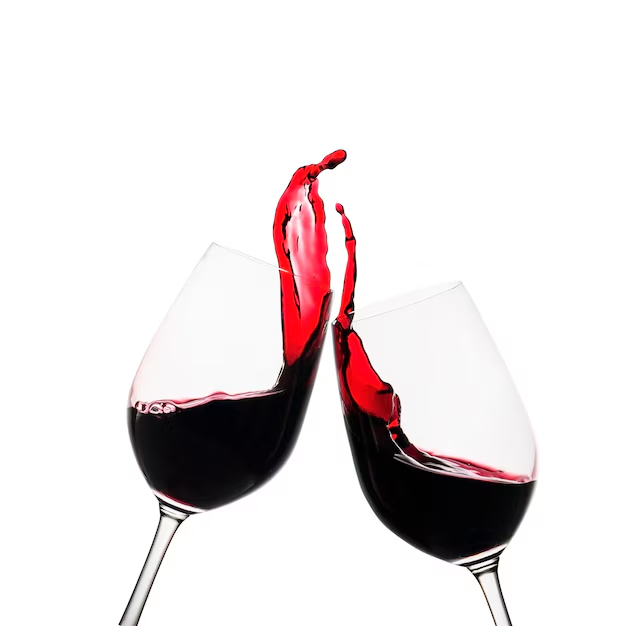

Le marché des vins fins représente un secteur économique de plusieurs milliards d'euros, où la contrefaçon est devenue un problème majeur. Cette pratique frauduleuse frappe particulièrement les grands crus et les bouteilles d'exception, dont la valeur peut atteindre plusieurs milliers d'euros.

# Un problème en pleine expansion

La contrefaçon vinicole touche principalement les vins prestigieux : Bordeaux grands crus classés, grands Bourgognes, champagnes de renom. Selon les estimations de la FEVS (Fédération des Exportateurs de Vins et Spiritueux), environ 20% des vins fins vendus dans le monde seraient des contrefaçons, représentant un préjudice annuel de plus de 3 milliards d'euros pour l'industrie.

La Chine constitue l'un des principaux marchés où circulent ces fausses bouteilles, mais le phénomène s'étend désormais à l'échelle mondiale. L'affaire Rudy Kurniawan, condamné en 2014 aux États-Unis pour avoir vendu pour plus de 35 millions de dollars de faux grands crus, a révélé l'ampleur du problème.

Face à cette menace, l'industrie vinicole développe des technologies anti-contrefaçon de plus en plus sophistiquées
comme les étiquettes avec hologrammes et QR codes sécurisés, les puces RFID intégrées dans les bouteilles, les technologies blockchain pour assurer la traçabilité, l'analyses physico-chimique, isotopiques et sensorielle permettant d'authentifier l'origine d'un vin. 

Et si on apporter une améliore de plus pour la certification et l'authentification du vin en utilisant une approche plus scientifique qui est la technique d'Imagerie Macroscopique à Effet Couronne couplé avec du Machine Learning?

Pour cela, dans notre étude nous avons pris de deux vins : 
- La Cave d'Augustin Florent "Large Malartic", 2022, A.O.P Bordeaux, Vin Rouge de caractéristiques:

Couleur : Rouge

Pays d'origine : France

Région : Bordeaux

Appellation : A.O.P Bordeaux

Cépages : Merlot - Cabernet Sauvignon

Degré d'alcool : 13% vol

Niveau de garde : De 2 à 5 ans 

- Raimbault Magistrale, AOP Gaillac, 2022, Vin Rouge de caractéristiques:

Couleur : Rouge

Pays d'origine : France

Région : Gaillac

Appellation : A.O.P Gaillac

Cépages : Braucol, Syrah, Duras et Merlot

Vignoble : Gaillac – Terrasses alluviales de la rive gauche du Tarn. Coteaux Rive Droite, molassiques. 

Degré d'alcool : 13% vol

Niveau de garde : De 3 à 5 ans



# Comment faire?
Nous avons développer une technique d'imagerie appelé imagerie macroscopique par effet couronne.
L'imagerie macroscopique par effet couronne est une technique qui permet de visualiser une sorte de flux lumineux autour des objets. Cette technique utilise un appareil appelé EDS© (Electrophotonic DataPhoton System).

- Comment ça fonctionne ?

. L'appareil crée un champ électrique autour de l'objet à étudier

. Ce champ électrique provoque une ionisation de l'air autour de l'objet

. Cette ionisation produit une lumière (principalement ultraviolette)

. Une caméra spéciale capture cette lumière

- L'appareil EDS©

. Développé depuis 2009 par l'entreprise Electrophotonique Ingénierie

. Composé de trois éléments principaux:

     * Un générateur électrique (AEPG©)
     
     * Une électrode en quartz pur (EFUSE©)
     
     * Une caméra haute définition capable de capturer les rayons ultraviolets

- Applications

Cette technique peut être utilisée pour étudier différents types d'objets:

. Des parties du corps humain

. Des gouttes de liquides

. Des minéraux

. Et bien d'autres choses

En résumé, cette technologie permet de visualiser des phénomènes invisibles à l'œil nu en créant une "décharge électrique" spéciale autour des objets et en capturant la lumière émise lors de ce processus.


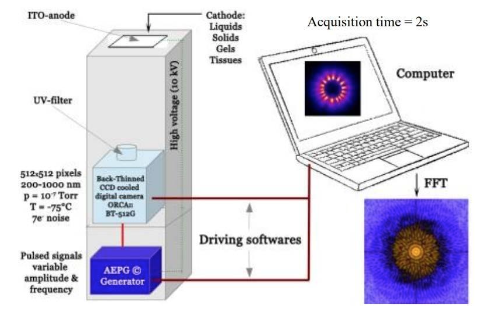


# Approche expérimentale
Pour chaque qualité de vin, cinq échantillons ont été prélevés dans un tube de 150mL. 
Pour chacun de ces échantillons, vingt gouttelettes ont été stimulées et filmées. Un porte-pipette spécialement conçu est utilisé pour réduire l'intensité de l'arrière-plan de l'image et éviter la lumière parasite. Une buse conductrice est utilisée sur la pipette pour déposer la gouttelette sur l'électrode conductrice et transparente et la stimuler à une fréquence de 90 Hz et une tension de 11 kV pendant 2000 ms.  La gouttelette est filmée et photographée entre 30000ms et 35000ms selon le temps d'exposition. On a donc entre 18 et 20 stimulations (images) pour une goutte d'eau. Cette stimulation est considérée comme une autre configuration de la goutte au cours du temps. Nous avons environ 400 images pour un lot. L'appareil EDS© stocke ensuite les images de décharge corona générées autour de la goutte au format TIFF 16 bits. Une base de données de 2000 images pour chaque qualité d'eau est ainsi obtenue. 
Voici un exemple d'image d'une goutelette de vin 


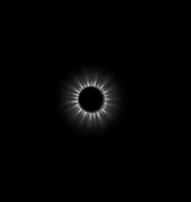


# Exploitation des données
Une fois l'acquisition des images terminée, nous convertissons chaque image en une matrice de lignes de n colonnes. « n » est le nombre de paramètres de l'image tels que la moyenne de l'intensité de l'image, l'écart-type, l'entropie, etc. Un paramètre de classe est également défini pour identifier les groupes (respectivement 0 pour le vin de "Bordeaux", 1 pour "Gaillac"). Une fois la conversion de toutes les images terminée, on obtient un tableau de m lignes et n colonnes où "m" est le nombre d'images qui sont nos individus et les paramètres nos variables. Dans notre étude, nous avons un total de 3515 individus et 102 variables.

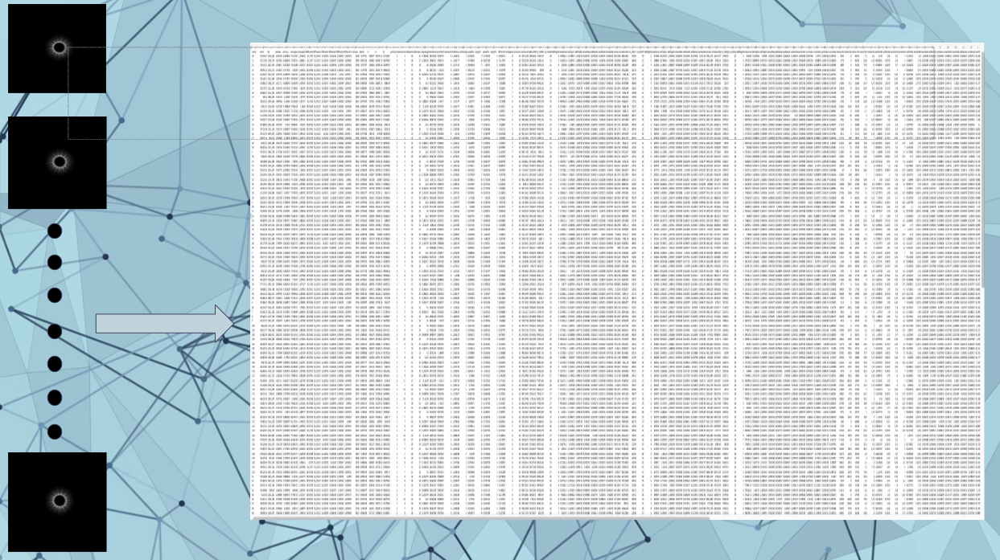

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

In [2]:
data = pd.read_excel("/Users/imec.eu.com/Downloads/BordeauxGaillac.xlsx", index_col = 0)
data

,name,mean,std,variance,entropy,entropylog,entropyRatio,fftPhaseEntropy,fftPowerEntropy,fftPhaseEntropylog,...,varRatiosZones45,ecartMaxRatiosZones45,sumEntropyCircle,sumEntropyLine,sumEntropyLog2Circle,sumEntropyLog2Line,ratioSumEntropyCircle,ratioSumEntropyLine,lineHSStdToCircleHS,classe
1565,2426,54.038239,36.734840,1349.448364,4.607218,6.865827,1.490233,12.374823,10.315221,16.502487,...,0.007396,0.233258,4.701244,6.255467,6.141546,8.849285,1.306366,1.414648,8.349168,0
1566,2427,53.358952,37.761814,1425.954712,4.619547,6.827075,1.477867,12.374884,10.315221,16.502518,...,0.008430,0.267161,4.706584,6.237186,6.144928,8.839159,1.305603,1.417171,9.981092,0
1567,2428,52.748478,37.515678,1407.426147,4.638163,6.831813,1.472957,12.375616,10.315221,16.502884,...,0.005266,0.174054,4.713024,6.242100,6.155908,8.834374,1.306148,1.415289,8.535166,0
1568,2429,58.828167,38.443527,1477.904663,4.651987,6.924525,1.488509,12.374151,10.315221,16.502152,...,0.010246,0.231363,4.692882,6.286046,6.153302,8.854812,1.311199,1.408646,8.649016,0
1569,243,56.423847,45.021500,2026.935425,4.695781,6.942746,1.478507,12.374395,10.315190,16.502274,...,0.019405,0.349483,4.671183,6.128298,6.203265,8.708113,1.327986,1.420968,12.027951,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3510,995,53.274704,33.281796,1107.677856,4.637095,6.880944,1.483891,12.375616,10.315221,16.502884,...,0.008255,0.198325,4.689158,6.287755,6.093537,8.877945,1.299495,1.411942,7.674050,1
3511,996,56.024925,33.404816,1115.881592,4.630442,6.871408,1.483964,12.374151,10.315221,16.502152,...,0.005523,0.187116,4.690471,6.285191,6.115904,8.876008,1.303900,1.412210,7.353545,1
3512,997,59.610622,36.495167,1331.897217,4.675059,7.011965,1.499867,12.375494,10.315221,16.502823,...,0.004193,0.135516,4.684276,6.315801,6.077881,8.897823,1.297507,1.408819,6.379480,1
3513,998,51.595444,31.791506,1010.699890,4.562081,6.776198,1.485330,12.374090,10.315221,16.502068,...,0.014607,0.294395,4.693217,6.250431,6.131402,8.845597,1.306439,1.415198,8.662060,1


In [3]:
dataset = data.drop(columns=['name'])

In [4]:
dataset = dataset.sample(frac=1, random_state=42).reset_index(drop=True)
dataset

,mean,std,variance,entropy,entropylog,entropyRatio,fftPhaseEntropy,fftPowerEntropy,fftPhaseEntropylog,fftPowerEntropylog,...,varRatiosZones45,ecartMaxRatiosZones45,sumEntropyCircle,sumEntropyLine,sumEntropyLog2Circle,sumEntropyLog2Line,ratioSumEntropyCircle,ratioSumEntropyLine,lineHSStdToCircleHS,classe
0,59.875904,40.408577,1632.853027,4.648661,6.942010,1.493335,12.374517,10.315221,16.502335,15.464508,...,0.020032,0.340467,4.703105,6.043641,6.120083,8.611863,1.301286,1.424946,9.378353,1
1,58.371243,41.506508,1722.790039,4.727855,7.068605,1.495098,12.374701,10.315221,16.502426,15.464386,...,0.063212,0.648432,4.738750,6.274235,6.320984,8.848933,1.333893,1.410360,14.566599,1
2,43.510857,27.330507,746.956665,4.595132,6.488478,1.412033,12.374212,10.315221,16.502182,15.463462,...,0.004274,0.184716,4.677867,6.102388,6.041371,8.708482,1.291480,1.427061,3.034675,0
3,73.372917,48.304756,2333.349365,4.998672,7.412142,1.482822,12.375250,10.315221,16.502701,15.462982,...,0.036917,0.429891,4.714244,6.285344,6.065350,8.853477,1.286601,1.408591,6.156185,1
4,47.276318,35.883968,1287.659180,4.651133,6.673190,1.434745,12.373968,10.315221,16.502007,15.464118,...,0.037910,0.530409,4.675700,6.042817,6.240429,8.621016,1.334651,1.426655,12.623278,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1945,41.392899,30.625126,937.898376,4.598489,6.343788,1.379537,12.374640,10.315221,16.502396,15.464141,...,0.008439,0.216942,4.666941,6.040101,6.197566,8.638723,1.327972,1.430228,12.249413,1
1946,43.989037,27.809837,773.387085,4.544656,6.476868,1.425161,12.373480,10.315221,16.501816,15.465057,...,0.000312,0.035005,4.698375,6.232547,6.113063,8.827322,1.301101,1.416327,10.694414,1
1947,39.611332,20.566988,423.000977,4.430640,6.116502,1.380501,12.374975,10.315221,16.502537,15.464569,...,0.001815,0.091024,4.695537,5.982605,6.118869,8.582534,1.303124,1.434581,6.201702,0
1948,65.365105,44.361820,1967.970947,4.706157,7.246435,1.539778,12.374273,10.315221,16.502213,15.464508,...,0.001202,0.074484,4.677775,6.410834,6.063457,8.995166,1.296227,1.403119,3.287508,1


In [5]:
#print(dir(data))
print(type(dataset))

<class 'pandas.core.frame.DataFrame'>


In [6]:
pd.set_option('display.max_row', 103)


# Exploration des données
Notre objectif dans cette partie c'est de mieux comprendre notre donnée. 
De regarder la distribution de chaque variable, relation entre eux, les variables qui sont signifiants et qui prédit mieux notre variable cible. 

In [7]:
dataset.dtypes

mean                      float64
std                       float64
variance                  float64
entropy                   float64
entropylog                float64
entropyRatio              float64
fftPhaseEntropy           float64
fftPowerEntropy           float64
fftPhaseEntropylog        float64
fftPowerEntropylog        float64
fftPhaseEntropyRatio      float64
fftPowerEntropyRatio      float64
kEntropy                  float64
richness                    int64
biodiv                    float64
l1                          int64
l2                        float64
h1                        float64
premiereDemiVie             int64
deuxiemeDemiVie             int64
nbDeperd95                  int64
nbStreamer                  int64
frequAngStream            float64
meanStream                float64
maxPlotTF                 float64
distance1stDecay            int64
firstDecay                float64
nbPicsSignif                int64
ampl1Pic                  float64
long1Pic      

In [8]:
df = dataset.copy()

<Axes: >

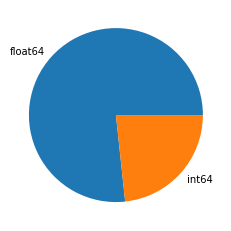

In [9]:
df.dtypes.value_counts().plot.pie()

Ce graphique circulaire montre la distribution des types de données dans notre DataFrame.
D'après ce qu'on peux voir, notre DataFrame contient principalement deux types de données:

- Une grande majorité (environ 75-80%) des colonnes sont de type float64.

- Une proportion plus petite (environ 20-25%) des colonnes sont de type int64. 

Cela signifie que:

* Notre jeu de données est entièrement numérique.

* La plupart de vos variables sont des nombres à virgule flottante (float64)

* Une minorité de vos variables sont des entiers (int64)


<Axes: >

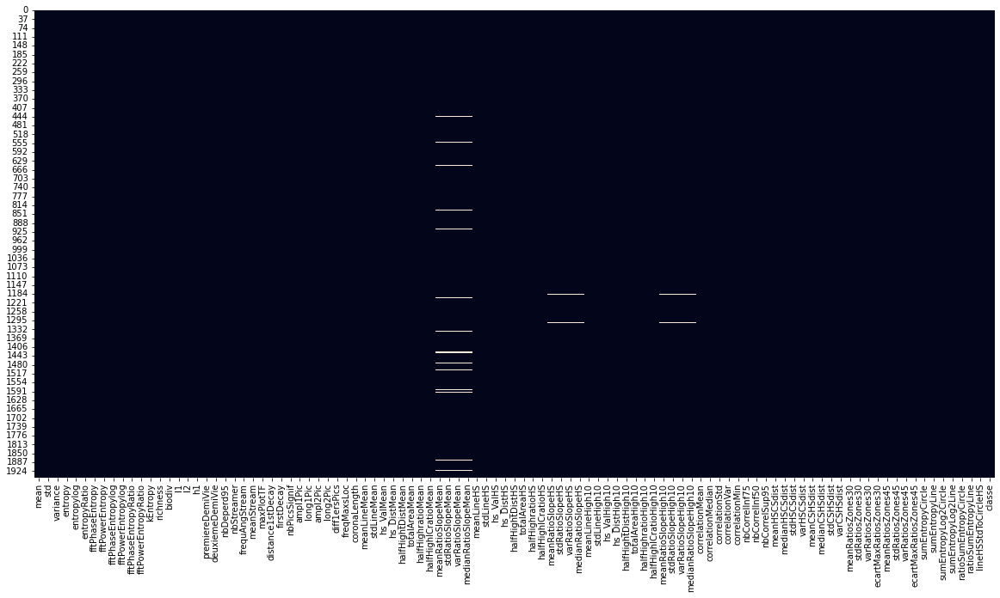

In [10]:
#visualisation des valeurs manquantes
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

Cette visualisation nous montre rapidement la structure des données manquantes dans notre jeu de donnée.
Les cellules blanc nous indiquent ces valeurs manquantes.

In [11]:
#Tableau des valeurs manquentes par colonne
missing_values = df.isnull().sum()
missing_percent = (missing_values/len(df))*100
missing_table = pd.DataFrame({'Valeurs Manquantes': missing_values, 'Pourcentage': missing_percent})
print(missing_table)

                        Valeurs Manquantes  Pourcentage
mean                                     0     0.000000
std                                      0     0.000000
variance                                 0     0.000000
entropy                                  0     0.000000
entropylog                               0     0.000000
entropyRatio                             0     0.000000
fftPhaseEntropy                          0     0.000000
fftPowerEntropy                          0     0.000000
fftPhaseEntropylog                       0     0.000000
fftPowerEntropylog                       0     0.000000
fftPhaseEntropyRatio                     0     0.000000
fftPowerEntropyRatio                     0     0.000000
kEntropy                                 0     0.000000
richness                                 0     0.000000
biodiv                                   0     0.000000
l1                                       0     0.000000
l2                                       0     0

Faisons une analyse des variables pour essayer de comprendre leur distribution 
Vu qu'on a que des données numériques mais de type flottante et discrète. On va regarder regarder la distribution et l'histogramme de nos variables en fonction de leur types.

/var/folders/8x/5glvyl755hzfmfb0sr_8nfsr0000gn/T/ipykernel_1266/2414076389.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<Figure size 432x288 with 0 Axes>

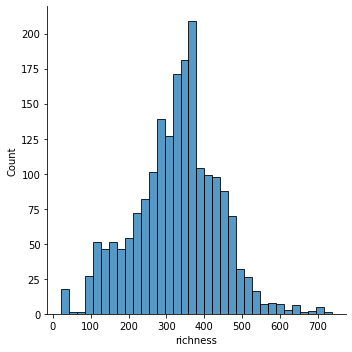

<Figure size 432x288 with 0 Axes>

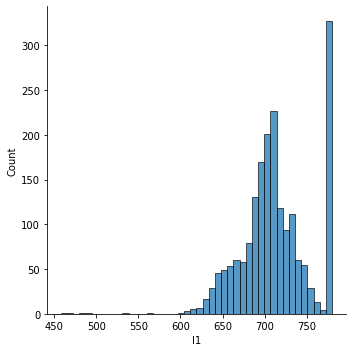

<Figure size 432x288 with 0 Axes>

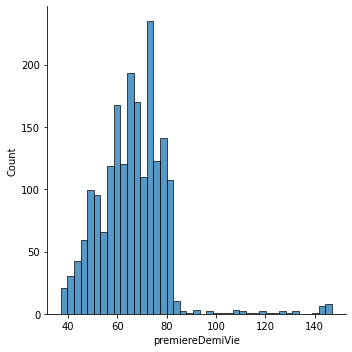

<Figure size 432x288 with 0 Axes>

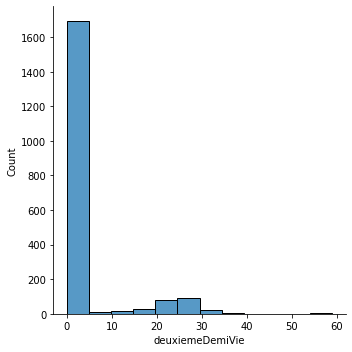

<Figure size 432x288 with 0 Axes>

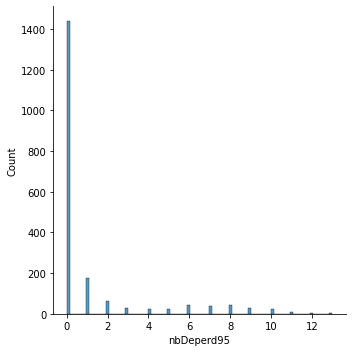

<Figure size 432x288 with 0 Axes>

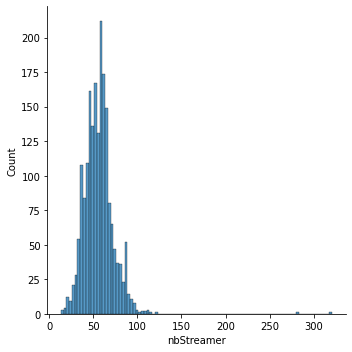

<Figure size 432x288 with 0 Axes>

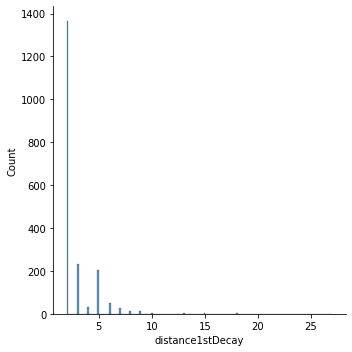

<Figure size 432x288 with 0 Axes>

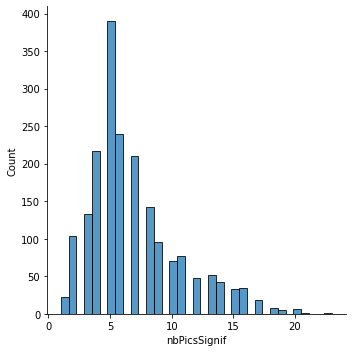

<Figure size 432x288 with 0 Axes>

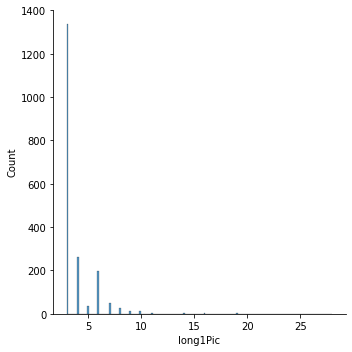

<Figure size 432x288 with 0 Axes>

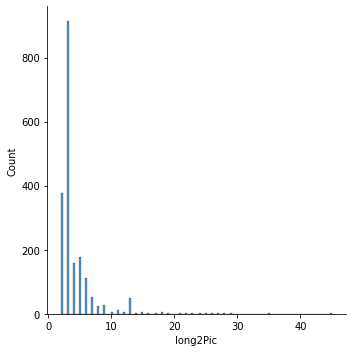

<Figure size 432x288 with 0 Axes>

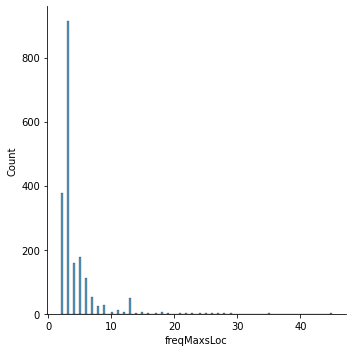

<Figure size 432x288 with 0 Axes>

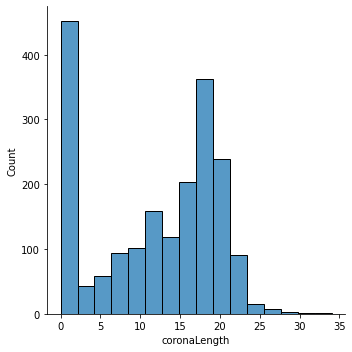

<Figure size 432x288 with 0 Axes>

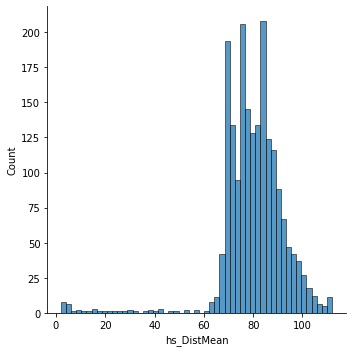

<Figure size 432x288 with 0 Axes>

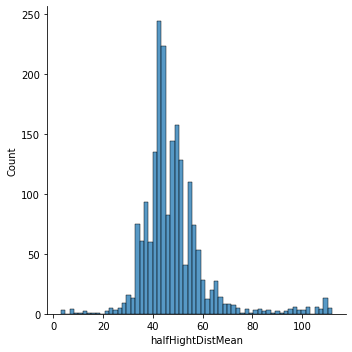

<Figure size 432x288 with 0 Axes>

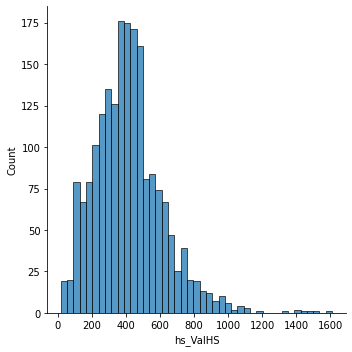

<Figure size 432x288 with 0 Axes>

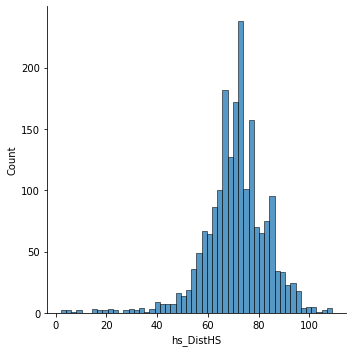

<Figure size 432x288 with 0 Axes>

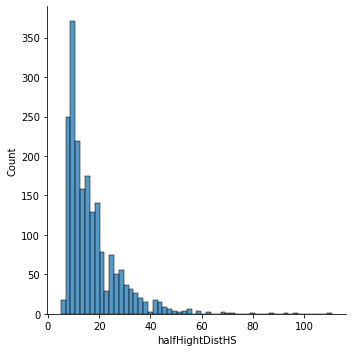

<Figure size 432x288 with 0 Axes>

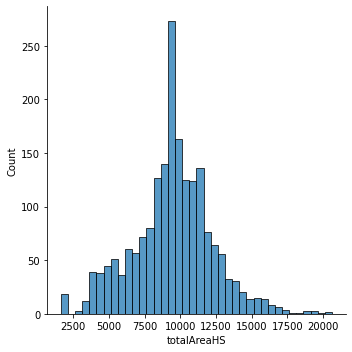

<Figure size 432x288 with 0 Axes>

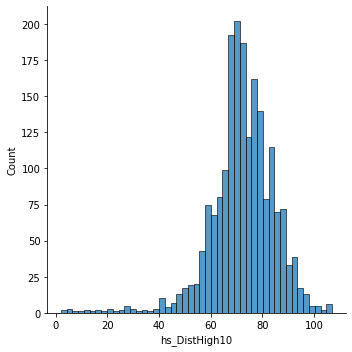

<Figure size 432x288 with 0 Axes>

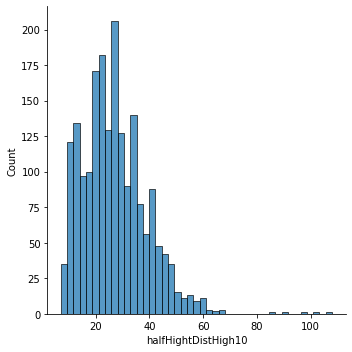

<Figure size 432x288 with 0 Axes>

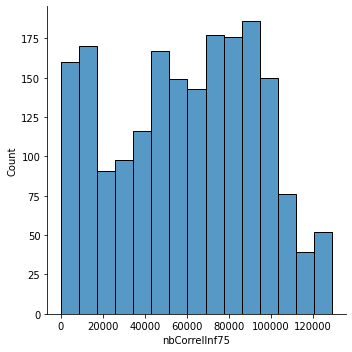

<Figure size 432x288 with 0 Axes>

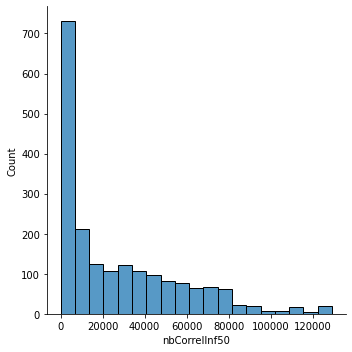

<Figure size 432x288 with 0 Axes>

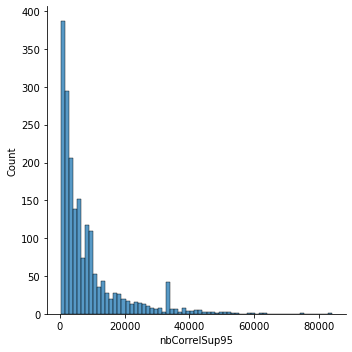

<Figure size 432x288 with 0 Axes>

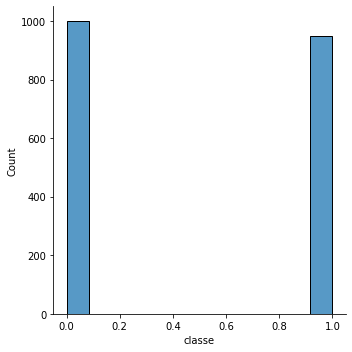

In [12]:
for col in df.select_dtypes('int64'):
    plt.figure()
    sns.displot(df[col])

In [13]:


def plot_histograms_by_type(df, dtype='float64', figsize=(30, 400)):
    # Sélectionner uniquement les colonnes du type spécifié
    columns = df.select_dtypes(include=[dtype]).columns
    
    if len(columns) == 0:
        print(f"Aucune variable de type {dtype} trouvée dans le DataFrame.")
        return
    
    # Calculer la disposition de la grille
    n_cols = 2  # Nombre de colonnes dans la grille
    n_rows = (len(columns) + 1) // 2  # Arrondir au supérieur
    
    # Créer la figure et les axes
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_rows * n_cols > 1:  # Si plus d'un subplot
        axes = axes.flatten()  # Convertir en tableau 1D pour faciliter l'indexation
    else:
        axes = [axes]  # Pour assurer que axes est toujours itérable
    
    # Tracer chaque variable
    for i, col in enumerate(columns):
        if i < len(axes):
            # Histogramme avec courbe KDE
            sns.histplot(data=df, x=col, bins=15, kde=True, color='skyblue', 
                         edgecolor='black', ax=axes[i])
            
            axes[i].set_title(f'Histogramme de {col}',fontsize=16)
            axes[i].set_xlabel('Valeur',fontsize=16)
            axes[i].set_ylabel('Fréquence',fontsize=16)
            axes[i].grid(axis='y', alpha=0.3)
    
    # Supprimer les subplots vides
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.suptitle(f'Histogrammes des variables de type {dtype}', fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

# Utilisation pour les variables float64
plot_histograms_by_type(df, dtype='float64')


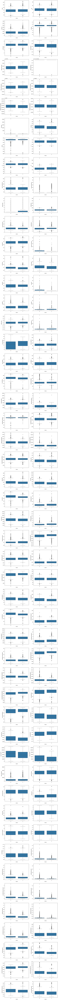

In [14]:
# Visualisation des tendances centrales et de la dispersion à l'aide de boxplots
# Calculer le nombre de colonnes (excluant 'classe')
n_cols = len(df.columns) - 1
n_rows = (n_cols + 1) // 2  # Arrondir au supérieur

fig, axes = plt.subplots(n_rows, 2, figsize=(12, 4*n_rows))
# Aplatir le tableau d'axes pour faciliter l'indexation
axes = axes.flatten()

for i, col in enumerate(df.columns[:-1]):
    if i < len(axes):  # Pour éviter l'erreur d'index
        sns.boxplot(x="classe", y=col, data=df, ax=axes[i])

# Supprimer les subplots vides
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])
    
plt.tight_layout()
plt.show()

Nous allons regarder la normalité de nos variables pour après voir la relation entre eux. 
Vu que nous avons un grand nombre d'observaton et de variables, nous utilisons les métriques de formes (Skewness et Kurtosis)pour évaluer la normalité de toute les variables.


In [15]:
import pandas as pd
import numpy as np

def evaluer_normalite(df, seuil_skew=1.0, seuil_kurt=3.0):
    resultats = []
    
    for colonne in df.columns:
        # Calculer skewness (asymétrie) et kurtosis (aplatissement)
        skewness = df[colonne].skew()
        kurtosis = df[colonne].kurt()
        
        # Interpréter les résultats
        if abs(skewness) < seuil_skew and abs(kurtosis) < seuil_kurt:
            normalite = "Approximativement normale"
        else:
            raisons = []
            if abs(skewness) >= seuil_skew:
                direction = "à droite" if skewness > 0 else "à gauche"
                raisons.append(f"asymétrie {direction} (skew={skewness:.2f})")
            if abs(kurtosis) >= seuil_kurt:
                forme = "leptokurtique (pics prononcés)" if kurtosis > 0 else "platykurtique (aplatie)"
                raisons.append(f"distribution {forme} (kurt={kurtosis:.2f})")
            
            normalite = "Non normale: " + ", ".join(raisons)
        
        resultats.append({
            'Variable': colonne,
            'Skewness': skewness,
            'Kurtosis': kurtosis,
            'Évaluation': normalite
        })
    
    return pd.DataFrame(resultats)

# Exécution de la fonction avec notre dataframe
resultats_normalite = evaluer_normalite(df)

# Afficher les résultats
print(resultats_normalite)

# Pour n'afficher que les variables approximativement normales
variables_normales = resultats_normalite[resultats_normalite['Évaluation'] == "Approximativement normale"]
print("\nVariables approximativement normales:")
print(variables_normales)

# Pour compter le nombre de variables normales
nb_normales = len(variables_normales)
nb_total = len(resultats_normalite)
print(f"\nRésumé: {nb_normales} variables sur {nb_total} sont approximativement normales ({nb_normales/nb_total*100:.1f}%)")

                   Variable   Skewness     Kurtosis  \
0                      mean   0.486757     1.074202   
1                       std  -0.083080     0.463058   
2                  variance   1.205356     2.665877   
3                   entropy  -2.188182     7.735513   
4                entropylog  -1.826936     5.529597   
5              entropyRatio  -0.849672     0.608375   
6           fftPhaseEntropy   0.070610    -0.044132   
7           fftPowerEntropy  -7.496303    54.250202   
8        fftPhaseEntropylog   0.078300    -0.049092   
9        fftPowerEntropylog  -0.244600     0.349061   
10     fftPhaseEntropyRatio  -0.064925    -0.042910   
11     fftPowerEntropyRatio  -0.245235     0.349491   
12                 kEntropy  35.297173  1376.997659   
13                 richness  -0.065952     0.359458   
14                   biodiv  -5.100200    32.064542   
15                       l1  -0.279258     1.496435   
16                       l2  -0.517384     1.960438   
17        

Nous constatons alors que 41% de variables sont normalement distribuées. 
Maintenant
Nous allons utilisé la Correlation de Spearman pour voir la relation entre nos variables. 
Pourquoi Spearman ? Étant donnée que variables sont quantitatives. Les données ne sont pas normalement distribuées.
Et la relation entre les variables peut être monotone (linéaire ou non linéaire).

# Imputation des données

Nous alons faire une imputation par la médiane c'est à dire de remplacer par la médiane des valeurs non manquantes dans la variable les valeurs manquantes. Pourquoi cette imputation par la médiane, étant donné que nos variables sont continues et qui ont une distribution asymétrique d'après le test de normalité ci- dessus. 



In [16]:
# Méthode 1: Avec pandas directement
df_impute = df.copy()
    
# Identifier les colonnes avec des valeurs manquantes
cols_with_na = df.columns[df.isna().any()].tolist()
    
print(f"Imputation de {len(cols_with_na)} variables avec des valeurs manquantes")
    
# Appliquer l'imputation par la médiane pour ces colonnes
for col in cols_with_na:
    median_value = df[col].median()
    na_count = df[col].isna().sum
    print(f"  - {col}: {na_count} valeurs manquantes remplacées par la médiane ({median_value})")
    df_impute[col] = df[col].fillna(median_value)
        

Imputation de 12 variables avec des valeurs manquantes
  - meanRatioSlopeMean: <bound method NDFrame._add_numeric_operations.<locals>.sum of 0       False
1       False
2       False
3       False
4       False
        ...  
1945    False
1946    False
1947    False
1948    False
1949    False
Name: meanRatioSlopeMean, Length: 1950, dtype: bool> valeurs manquantes remplacées par la médiane (0.9819933176040649)
  - stdRatioSlopeMean: <bound method NDFrame._add_numeric_operations.<locals>.sum of 0       False
1       False
2       False
3       False
4       False
        ...  
1945    False
1946    False
1947    False
1948    False
1949    False
Name: stdRatioSlopeMean, Length: 1950, dtype: bool> valeurs manquantes remplacées par la médiane (0.011044227052479986)
  - varRatioSlopeMean: <bound method NDFrame._add_numeric_operations.<locals>.sum of 0       False
1       False
2       False
3       False
4       False
        ...  
1945    False
1946    False
1947    False
1948    False
19

In [17]:
print("\nVérification après imputation:")
print(df_impute.isna().sum().sum(), "valeurs manquantes au total")


Vérification après imputation:
0 valeurs manquantes au total


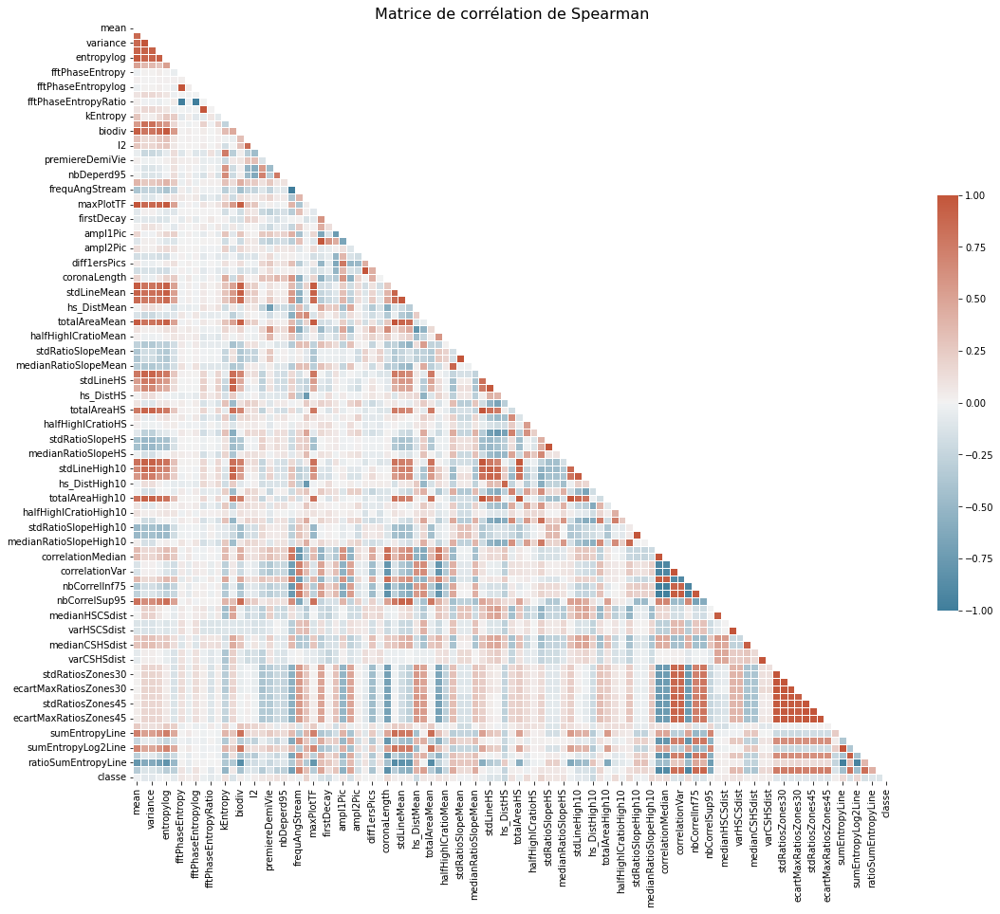

Corrélations les plus fortes (|r| > 0.7):
             Variable 1            Variable 2  Coefficient de corrélation
0        correlationStd        correlationVar                    1.000000
1       stdRatioSlopeHS       varRatioSlopeHS                    1.000000
2              long2Pic           freqMaxsLoc                    1.000000
3            meanLineHS           totalAreaHS                    1.000000
4     stdRatioSlopeMean     varRatioSlopeMean                    1.000000
..                  ...                   ...                         ...
371     correlationMean         nbCorrelInf50                   -0.988572
372     correlationMean         nbCorrelInf75                   -0.990510
373  fftPhaseEntropylog  fftPhaseEntropyRatio                   -0.996219
374     fftPhaseEntropy  fftPhaseEntropyRatio                   -0.998709
375          nbStreamer        frequAngStream                   -1.000000

[376 rows x 3 columns]
Seuil de significativité ajusté (Bonferroni): 

In [18]:
df = df_impute
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calculer la matrice de corrélation de Spearman
corr_matrix = df.corr(method='spearman')

# Visualiser la matrice de corrélation
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Masque pour afficher seulement la moitié inférieure
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=False)
plt.title('Matrice de corrélation de Spearman', fontsize=16)
plt.tight_layout()
plt.show()

# Si vous avez beaucoup de variables (103 dans votre cas), la matrice sera très grande
# Vous pouvez filtrer les corrélations fortes uniquement
def get_strong_correlations(corr_matrix, threshold=0.7):
    # Obtenir le triangle inférieur de la matrice
    corr_lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool))
    
    # Trouver les corrélations fortes (en valeur absolue)
    strong_corr = corr_lower.unstack().dropna()
    strong_corr = strong_corr[abs(strong_corr) > threshold]
    strong_corr = strong_corr.sort_values(ascending=False)
    
    # Convertir en DataFrame
    strong_corr_df = pd.DataFrame(strong_corr).reset_index()
    strong_corr_df.columns = ['Variable 1', 'Variable 2', 'Coefficient de corrélation']
    
    return strong_corr_df

# Trouver les corrélations fortes (ajustez le seuil selon vos besoins)
strong_correlations = get_strong_correlations(corr_matrix, threshold=0.7)
print("Corrélations les plus fortes (|r| > 0.7):")
print(strong_correlations)

# Pour tester la significativité des corrélations
from scipy import stats

def test_significance(df, alpha=0.05):
    results = []
    n_tests = len(df.columns) * (len(df.columns) - 1) // 2
    
    # Correction de Bonferroni pour les tests multiples
    adjusted_alpha = alpha / n_tests
    print(f"Seuil de significativité ajusté (Bonferroni): {adjusted_alpha}")
    
    for i, col1 in enumerate(df.columns):
        for col2 in df.columns[i+1:]:
            # Supprimer les lignes avec NA dans l'une ou l'autre variable
            valid_data = df[[col1, col2]].dropna()
            
            if len(valid_data) > 1:  # Au moins 2 paires de données sont nécessaires
                rho, p_value = stats.spearmanr(valid_data[col1], valid_data[col2])
                
                # Vérifier la significativité avec correction de Bonferroni
                is_significant = p_value < adjusted_alpha
                
                results.append({
                    'Variable 1': col1,
                    'Variable 2': col2,
                    'Coefficient': rho,
                    'p-value': p_value,
                    'Significatif': is_significant
                })
    
    return pd.DataFrame(results)

# Tester la significativité des corrélations
significance_results = test_significance(df)

# Afficher uniquement les corrélations significatives et fortes
significant_strong = significance_results[
    (significance_results['Significatif'] == True) & 
    (abs(significance_results['Coefficient']) > 0.7)
].sort_values(by='Coefficient', key=abs, ascending=False)

print("\nCorrélations significatives et fortes:")
print(significant_strong)

Nous constatons alors qu'il y  a une forte corrélation(positive ou négative) sur certains variables.
Nous alons garder alors ceyx qui prédit mieux notre variable cible.

In [19]:
bordeaux_df = df_final[df_final['classe'] == 0]
gaillac_df = df_final[df_final['classe'] == 1]

NameError: name 'df_final' is not defined

In [20]:
bordeaux_df1 = df[df['classe'] == 0]
gaillac_df1 = df[df['classe'] == 1]

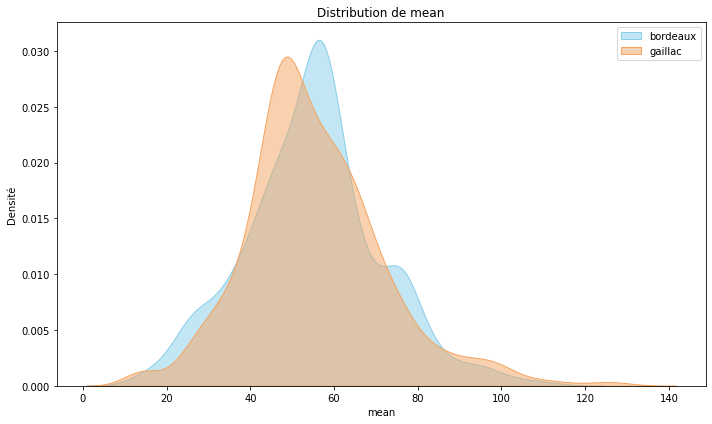

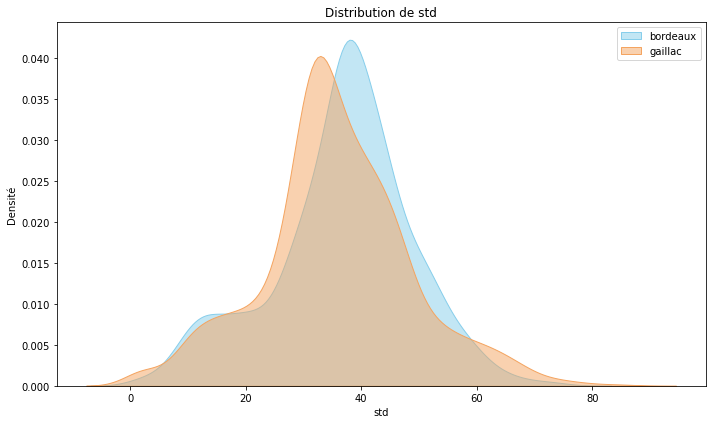

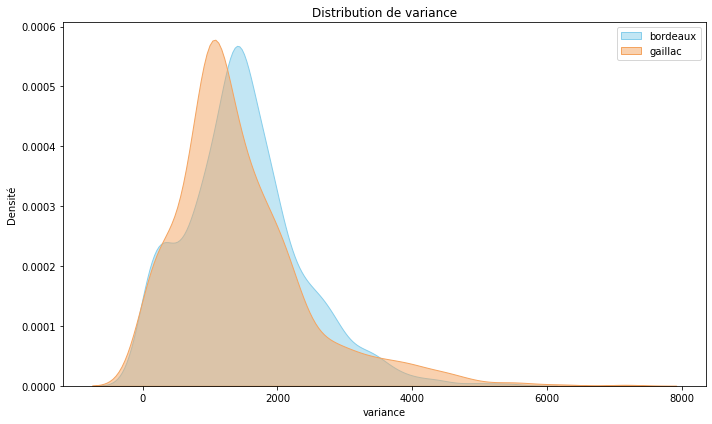

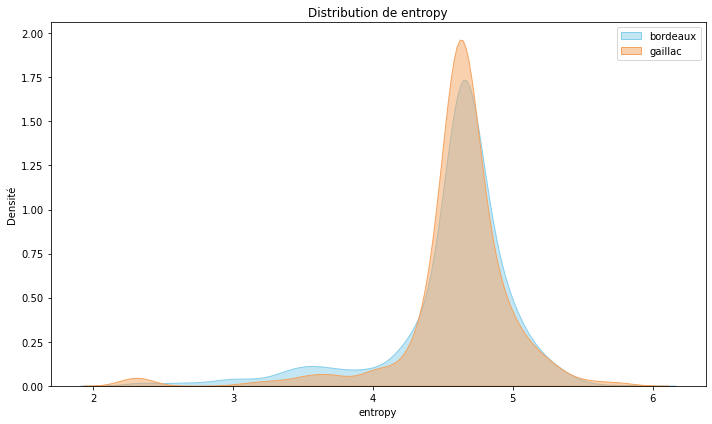

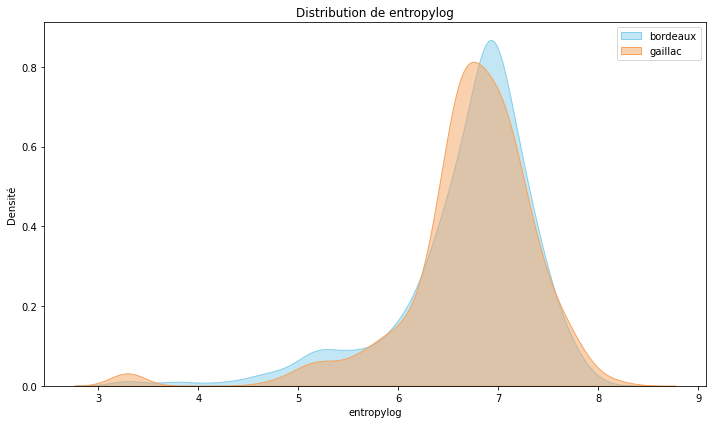

...

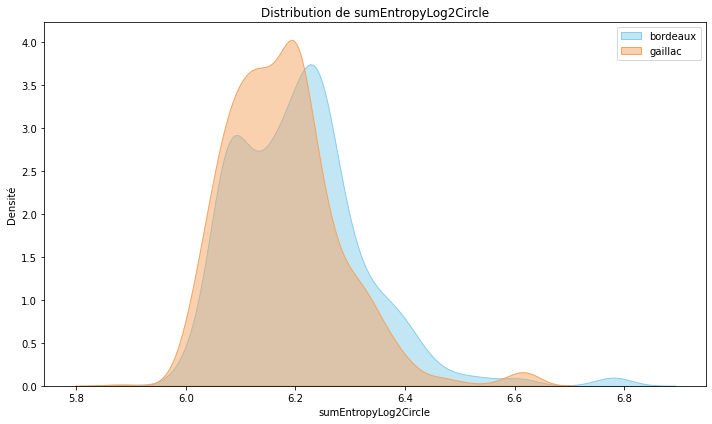

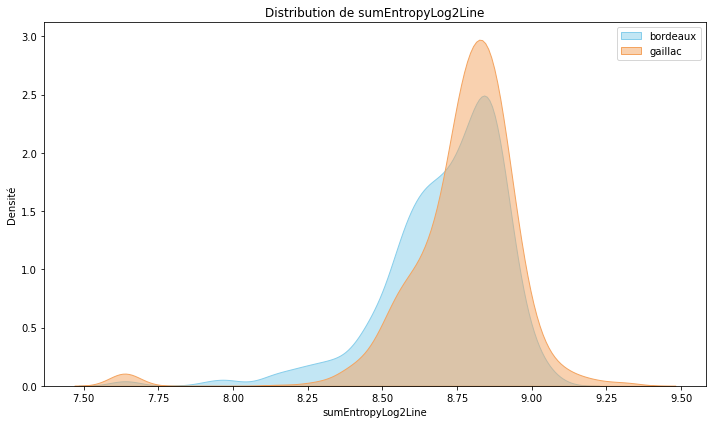

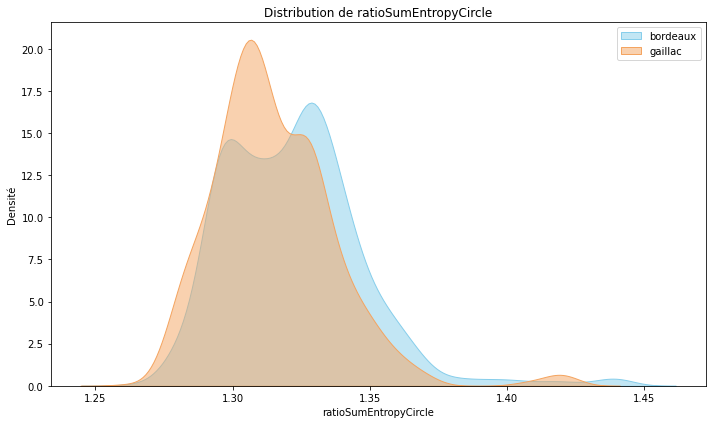

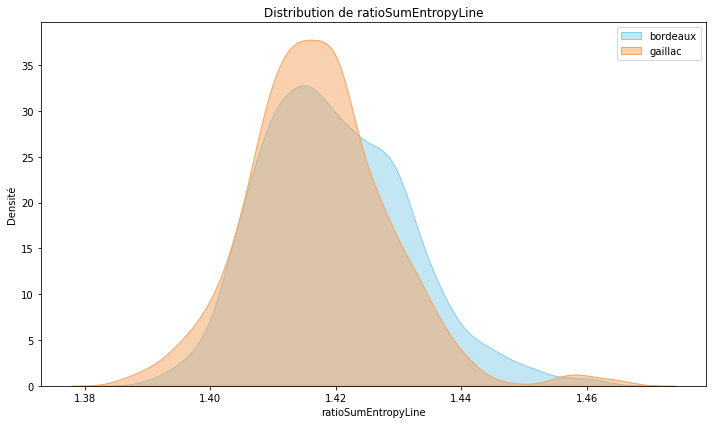

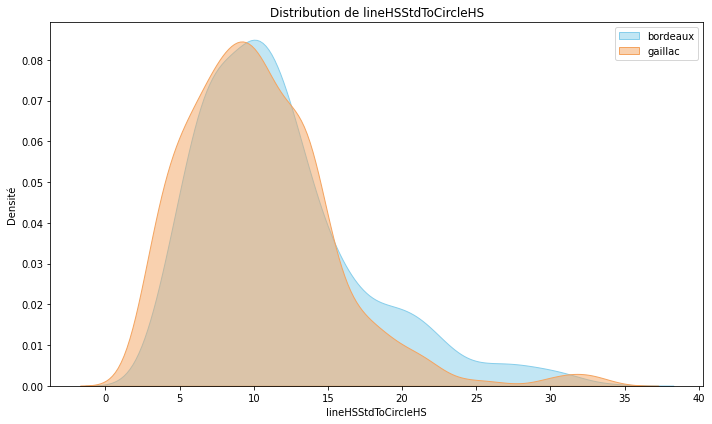

In [21]:
for col in df.columns:
    if col != 'classe':  # Ignorer la colonne classe
        plt.figure(figsize=(10, 6))
        
        # Utiliser kdeplot pour superposer les distributions
        sns.kdeplot(bordeaux_df1[col], label='bordeaux', color='skyblue', fill=True, alpha=0.5)
        sns.kdeplot(gaillac_df1[col], label='gaillac', color='sandybrown', fill=True, alpha=0.5)
        
        # Ou utiliser histplot pour avoir des histogrammes superposés
        # sns.histplot(bordeaux_df[col], label='bordeaux', color='skyblue', kde=True, alpha=0.5)
        # sns.histplot(gaillac_df[col], label='gaillac', color='sandybrown', kde=True, alpha=0.5)
        
        plt.title(f'Distribution de {col}')
        plt.xlabel(col)
        plt.ylabel('Densité')
        plt.legend()
        plt.tight_layout()
        plt.show()

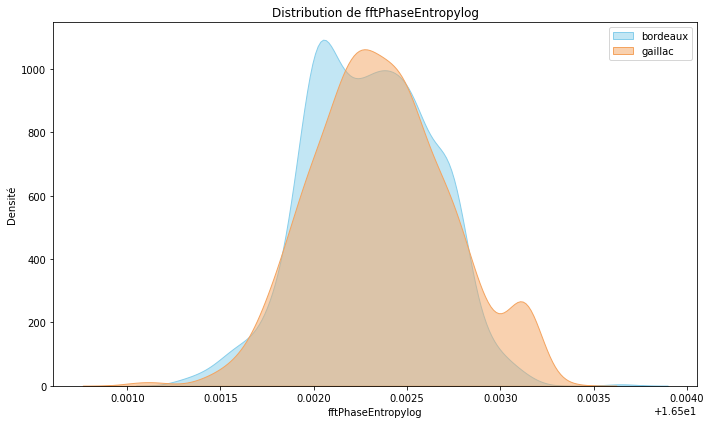

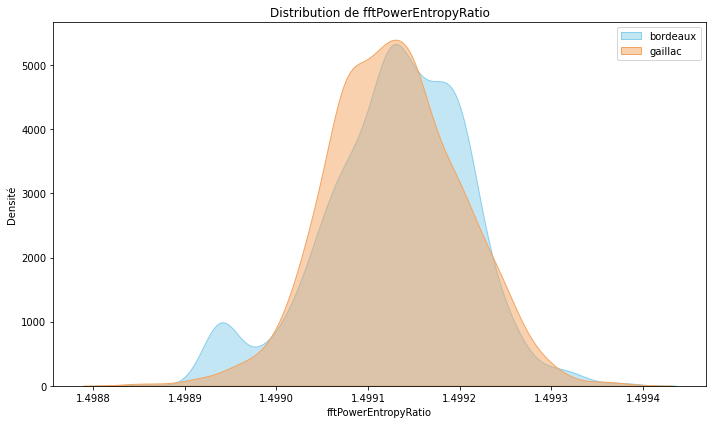

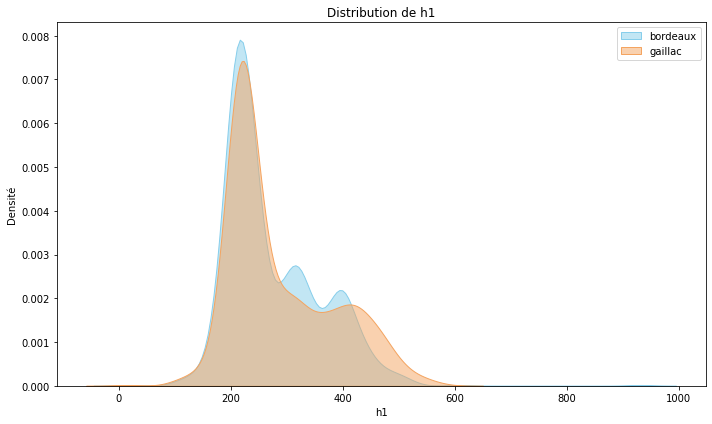

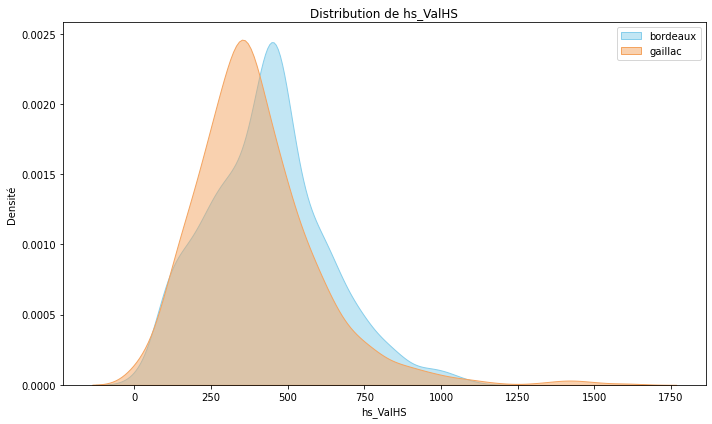

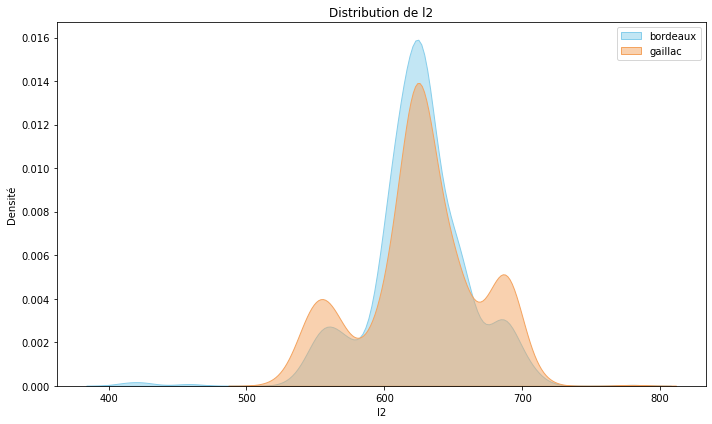

...

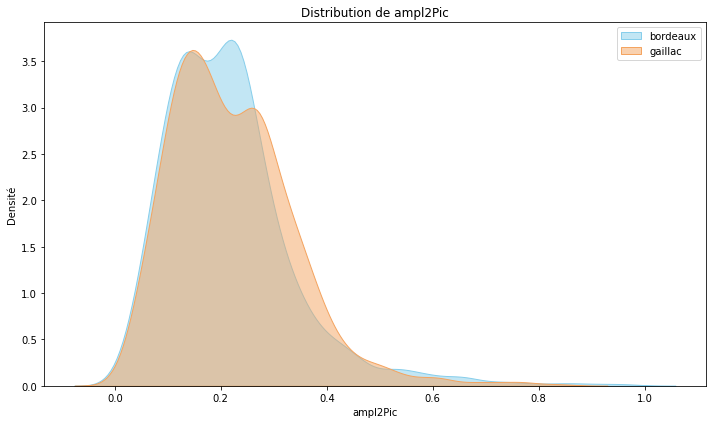

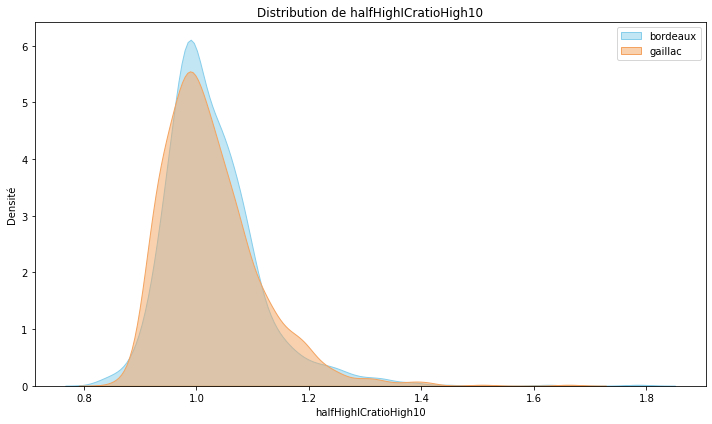

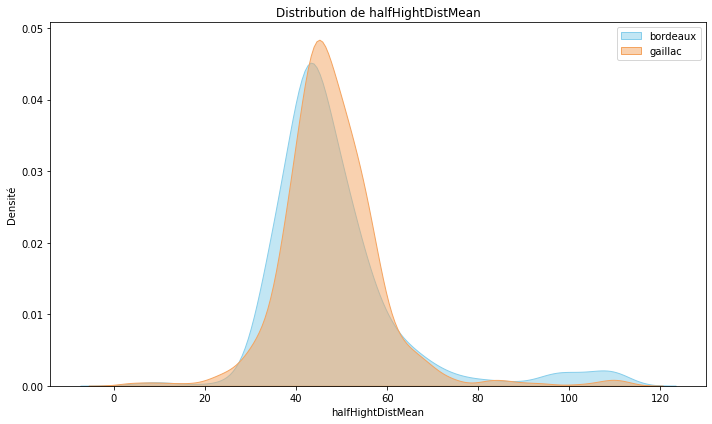

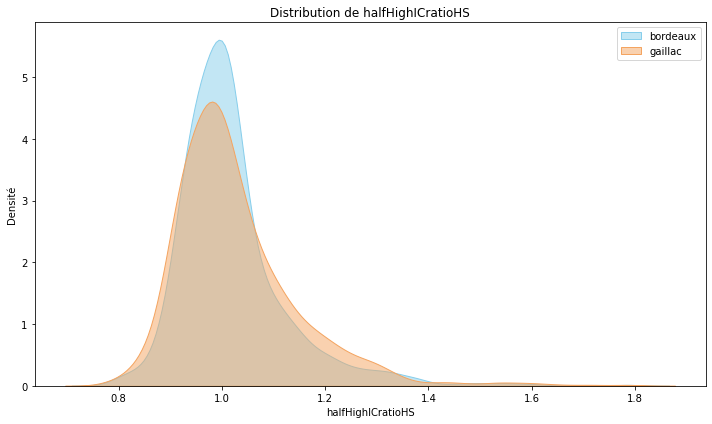

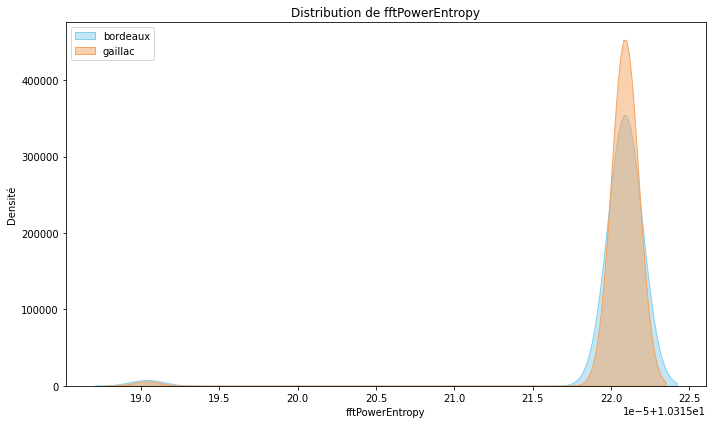

In [60]:
for col in df_final.columns:
    if col != 'classe':  # Ignorer la colonne classe
        plt.figure(figsize=(10, 6))
        
        # Utiliser kdeplot pour superposer les distributions
        sns.kdeplot(bordeaux_df[col], label='bordeaux', color='skyblue', fill=True, alpha=0.5)
        sns.kdeplot(gaillac_df[col], label='gaillac', color='sandybrown', fill=True, alpha=0.5)
        
        # Ou utiliser histplot pour avoir des histogrammes superposés
        # sns.histplot(bordeaux_df[col], label='bordeaux', color='skyblue', kde=True, alpha=0.5)
        # sns.histplot(gaillac_df[col], label='gaillac', color='sandybrown', kde=True, alpha=0.5)
        
        plt.title(f'Distribution de {col}')
        plt.xlabel(col)
        plt.ylabel('Densité')
        plt.legend()
        plt.tight_layout()
        plt.show()

# Sélection des variables
Comme nous le constatons, nous avons un certains nombre de variables qui sont corrélées. De ce fait il y aura forcement des informations qui seront redondant. Nous allons sélectionner alors les groupes de variables qui sont correlées entre eux. Puis de garder ceux qui prédit mieux la variable cible à partir de différents méthodes:

- Test F (ANOVA) pour mesurer la différence entre les classes

- Information mutuelle pour capturer les relations non linéaires

- Importance des variables selon Random Forest

Ainsi de selectionner la meilleure variable pour chaque groupe corrélé




Nombre de groupes de variables corrélées: 29

Top 10 variables par importance:
                  Variable   F_Score       P_Value  MI_Score  RF_Importance  \
3                hs_DistHS  0.029186  3.084739e-12  0.013594       0.023812   
2         meanRatioSlopeHS  0.030619  9.278446e-13  0.014286       0.018500   
6            hs_DistHigh10  0.025886  4.951783e-11  0.013909       0.023319   
0   medianRatioSlopeHigh10  0.034354  4.098555e-14  0.011710       0.014866   
35              meanStream  0.012140  6.355121e-06  0.015668       0.028517   
1              varHSCSdist  0.031040  6.520267e-13  0.011228       0.012866   
7       sumEntropyLog2Line  0.025148  9.227324e-11  0.016041       0.012086   
8    ratioSumEntropyCircle  0.024139  2.166649e-10  0.016117       0.012011   
10          sumEntropyLine  0.023224  4.700279e-10  0.014615       0.010776   
4     meanRatioSlopeHigh10  0.028035  8.106315e-12  0.005796       0.013839   

    Score_Moyen  
3      0.022197  
2      0.021135

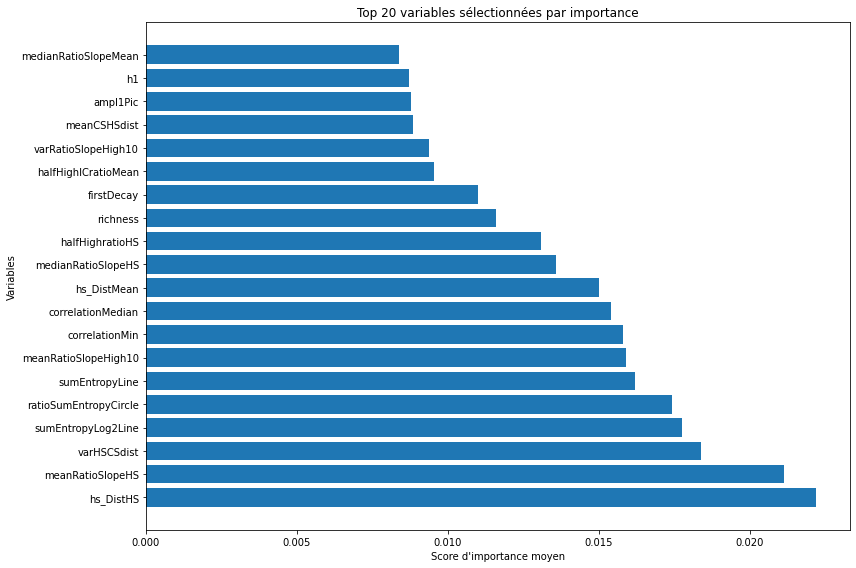

In [22]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

# 1. Identifier les groupes de variables corrélées
def identifier_groupes_correles(corr_matrix, threshold=0.7):
    # Copie de la matrice de corrélation
    corr = corr_matrix.copy()
    
    # Remplacer les diagonales par 0
    np.fill_diagonal(corr.values, 0)
    
    # Initialiser les groupes
    groupes_correles = []
    variables_traitees = set()
    
    for col in corr.columns:
        if col in variables_traitees:
            continue
        
        # Trouver les variables corrélées à la variable actuelle
        correlees = corr.index[abs(corr[col]) > threshold].tolist()
        
        if correlees:
            # Ajouter la variable courante au groupe
            groupe = [col] + correlees
            groupes_correles.append(groupe)
            variables_traitees.update(groupe)
        else:
            variables_traitees.add(col)
    
    return groupes_correles

# 2. Évaluer l'importance des variables par rapport à la cible (classe)
def evaluer_importance_variables(df, target_col='classe'):
    X = df.drop(columns=[target_col])
    y = df[target_col]
    
    # Méthode 1: ANOVA F-value
    selector_f = SelectKBest(f_classif, k='all')
    selector_f.fit(X, y)
    scores_f = pd.DataFrame({
        'Variable': X.columns,
        'F_Score': selector_f.scores_,
        'P_Value': selector_f.pvalues_
    }).sort_values(by='F_Score', ascending=False)
    
    # Méthode 2: Information mutuelle
    selector_mi = SelectKBest(mutual_info_classif, k='all')
    selector_mi.fit(X, y)
    scores_mi = pd.DataFrame({
        'Variable': X.columns,
        'MI_Score': selector_mi.scores_
    }).sort_values(by='MI_Score', ascending=False)
    
    # Méthode 3: Feature importance avec Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y)
    scores_rf = pd.DataFrame({
        'Variable': X.columns,
        'RF_Importance': rf.feature_importances_
    }).sort_values(by='RF_Importance', ascending=False)
    
    # Combiner les scores
    scores_combined = scores_f.merge(scores_mi, on='Variable').merge(scores_rf, on='Variable')
    
    # Normaliser les scores pour pouvoir les comparer
    for col in ['F_Score', 'MI_Score', 'RF_Importance']:
        if scores_combined[col].sum() > 0:  # Éviter division par zéro
            scores_combined[col] = scores_combined[col] / scores_combined[col].sum()
    
    # Score combiné (moyenne des scores normalisés)
    scores_combined['Score_Moyen'] = scores_combined[['F_Score', 'MI_Score', 'RF_Importance']].mean(axis=1)
    
    return scores_combined.sort_values(by='Score_Moyen', ascending=False)

# 3. Sélectionner les meilleures variables de chaque groupe
def selectionner_meilleures_variables(groupes_correles, scores_importance):
    variables_selectionnees = []
    
    # Pour chaque groupe de variables corrélées
    for groupe in groupes_correles:
        # Obtenir les scores d'importance pour ce groupe
        scores_groupe = scores_importance[scores_importance['Variable'].isin(groupe)]
        
        if not scores_groupe.empty:
            # Sélectionner la variable avec le meilleur score moyen
            meilleure_var = scores_groupe.iloc[0]['Variable']
            variables_selectionnees.append(meilleure_var)
    
    # Ajouter les variables non corrélées (celles qui ne sont pas dans un groupe)
    toutes_variables_groupes = [var for groupe in groupes_correles for var in groupe]
    variables_non_correlees = [var for var in scores_importance['Variable'] 
                              if var not in toutes_variables_groupes]
    
    variables_selectionnees.extend(variables_non_correlees)
    
    return variables_selectionnees

# Utilisation
# 1. Calculer la matrice de corrélation de Spearman
corr_matrix = df.drop(columns=['classe']).corr(method='spearman')

# 2. Identifier les groupes de variables corrélées
groupes_correles = identifier_groupes_correles(corr_matrix, threshold=0.7)
print(f"Nombre de groupes de variables corrélées: {len(groupes_correles)}")

# 3. Évaluer l'importance des variables
scores_importance = evaluer_importance_variables(df)
print("\nTop 10 variables par importance:")
print(scores_importance.head(10))

# 4. Sélectionner les meilleures variables
variables_selectionnees = selectionner_meilleures_variables(groupes_correles, scores_importance)
print(f"\nNombre de variables sélectionnées: {len(variables_selectionnees)}")
print("Variables sélectionnées:")
print(variables_selectionnees)

# 5. Visualiser l'importance des variables sélectionnées
plt.figure(figsize=(12, 8))
scores_filtered = scores_importance[scores_importance['Variable'].isin(variables_selectionnees)]
scores_filtered = scores_filtered.sort_values(by='Score_Moyen', ascending=False).head(20)

plt.barh(scores_filtered['Variable'], scores_filtered['Score_Moyen'])
plt.xlabel('Score d\'importance moyen')
plt.ylabel('Variables')
plt.title('Top 20 variables sélectionnées par importance')
plt.tight_layout()
plt.show()

Cette fonction va:

Créer un sous-ensemble de votre DataFrame avec uniquement les variables sélectionnées
Calculer une nouvelle matrice de corrélation de Spearman pour ces variables
Visualiser cette matrice sous forme de heatmap avec les coefficients de corrélation affichés
Vérifier s'il reste des corrélations fortes entre les variables sélectionnées
Afficher un rapport sur les éventuelles corrélations fortes restantes

Si vous obtenez encore des corrélations fortes entre certaines variables sélectionnées, cela pourrait indiquer que:

Le seuil de corrélation choisi n'était pas assez strict
Certaines variables font partie de plusieurs groupes de corrélation

Dans ce cas, vous pourriez soit:

Augmenter le seuil de corrélation (par exemple de 0.7 à 0.8)
Exécuter à nouveau l'algorithme de sélection sur les variables déjà sélectionnées
Retirer manuellement certaines variables qui restent fortement corrélées

L'objectif final est d'avoir un ensemble de variables prédictives qui sont toutes informatives pour la variable cible, mais avec une redondance minimale entre elles.

In [ ]:
def verifier_correlations_variables_selectionnees(df, variables_selectionnees):
    # Sélectionner uniquement les variables retenues + la variable cible
    df_reduit = df[variables_selectionnees + ['classe']]
    
    # Calculer la matrice de corrélation de Spearman entre les variables sélectionnées
    corr_matrix_reduit = df_reduit.drop(columns=['classe']).corr(method='spearman')
    
    # Visualiser la nouvelle matrice de corrélation
    plt.figure(figsize=(14, 12))
    mask = np.triu(np.ones_like(corr_matrix_reduit, dtype=bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    
    sns.heatmap(corr_matrix_reduit, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f",
                annot_kws={"size": 8})
    
    plt.title('Matrice de corrélation des variables sélectionnées', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Vérifier s'il reste des corrélations fortes
    corr_lower = corr_matrix_reduit.where(np.tril(np.ones(corr_matrix_reduit.shape), k=-1).astype(bool))
    strong_corr = corr_lower.unstack().dropna()
    strong_corr = strong_corr[abs(strong_corr) > 0.7]
    
    if len(strong_corr) > 0:
        print("Il reste des corrélations fortes (|r| > 0.7) entre les variables sélectionnées:")
        strong_corr = strong_corr.sort_values(ascending=False)
        strong_corr_df = pd.DataFrame(strong_corr).reset_index()
        strong_corr_df.columns = ['Variable 1', 'Variable 2', 'Coefficient de corrélation']
        print(strong_corr_df)
    else:
        print("Aucune corrélation forte (|r| > 0.7) ne reste entre les variables sélectionnées.")
    
    return corr_matrix_reduit

# Utilisation:
corr_matrix_reduit = verifier_correlations_variables_selectionnees(df, variables_selectionnees)

In [24]:
def filtrer_variables_correlees(variables_selectionnees, strong_corr_df, scores_importance):
    """
    Filtre les variables corrélées en se basant sur un DataFrame existant de corrélations fortes.
    
    Parameters:
    -----------
    variables_selectionnees : list
        Liste des variables déjà sélectionnées
    strong_corr_df : DataFrame
        DataFrame contenant les paires de variables fortement corrélées 
        avec colonnes 'Variable 1', 'Variable 2', 'Coefficient de corrélation'
    scores_importance : DataFrame
        DataFrame contenant les scores d'importance des variables
        
    Returns:
    --------
    list
        Liste des variables finales après filtrage
    """
    # Copier la liste des variables sélectionnées
    variables_finales = variables_selectionnees.copy()
    
    # Variables déjà traitées (à ne plus considérer pour élimination)
    variables_eliminees = set()
    
    print("Filtrage des variables corrélées:")
    
    # Parcourir les paires corrélées triées par force de corrélation
    for _, row in strong_corr_df.sort_values('Coefficient de corrélation', key=abs, ascending=False).iterrows():
        var1 = row['Variable 1']
        var2 = row['Variable 2']
        corr = row['Coefficient de corrélation']
        
        # Ignorer si l'une des variables est déjà éliminée
        if var1 in variables_eliminees or var2 in variables_eliminees:
            continue
            
        # Ignorer si l'une des variables n'est pas dans la liste des variables sélectionnées
        if var1 not in variables_finales or var2 not in variables_finales:
            continue
        
        # Obtenir les scores d'importance
        #score1 = scores_importance[scores_importance['Variable'] == var1]['Score_Moyen'].values
        score2 = scores_importance[scores_importance['Variable'] == var2]['Score_Moyen'].values
        
        # Vérifier si les scores existent
        if len(score1) == 0 or len(score2) == 0:
            continue
            
        score1 = score1[0]
        score2 = score2[0]
        
        # Éliminer la variable avec le score le plus faible
        if score1 < score2:
            variables_finales.remove(var1)
            variables_eliminees.add(var1)
            print(f"  Éliminé: {var1} (corrélé avec {var2}, corr={corr:.3f}, scores: {score1:.4f} vs {score2:.4f})")
        else:
            variables_finales.remove(var2)
            variables_eliminees.add(var2)
            print(f"  Éliminé: {var2} (corrélé avec {var1}, corr={corr:.3f}, scores: {score2:.4f} vs {score1:.4f})")
    
    print(f"\nNombre initial de variables: {len(variables_selectionnees)}")
    print(f"Nombre de variables éliminées: {len(variables_eliminees)}")
    print(f"Nombre final de variables: {len(variables_finales)}")
    
    return variables_finales

# Utilisez cette fonction avec le DataFrame de corrélations fortes que vous avez déjà
# Supposons que 'strong_corr_df' est le DataFrame que vous avez obtenu précédemment
# Variables affinées = filtrer_variables_correlees(variables_selectionnees, strong_corr_df, scores_importance)

Filtrage des variables corrélées:
  Éliminé: sumEntropyLine (corrélé avec sumEntropyLog2Line, corr=0.996, scores: 0.0162 vs 0.0178)
  Éliminé: correlationMedian (corrélé avec correlationMin, corr=0.939, scores: 0.0154 vs 0.0158)
  Éliminé: meanRatioSlopeHigh10 (corrélé avec meanRatioSlopeHS, corr=0.833, scores: 0.0159 vs 0.0211)
  Éliminé: correlationMin (corrélé avec ratioSumEntropyCircle, corr=-0.818, scores: 0.0158 vs 0.0174)

Nombre initial de variables: 40
Nombre de variables éliminées: 4
Nombre final de variables: 36


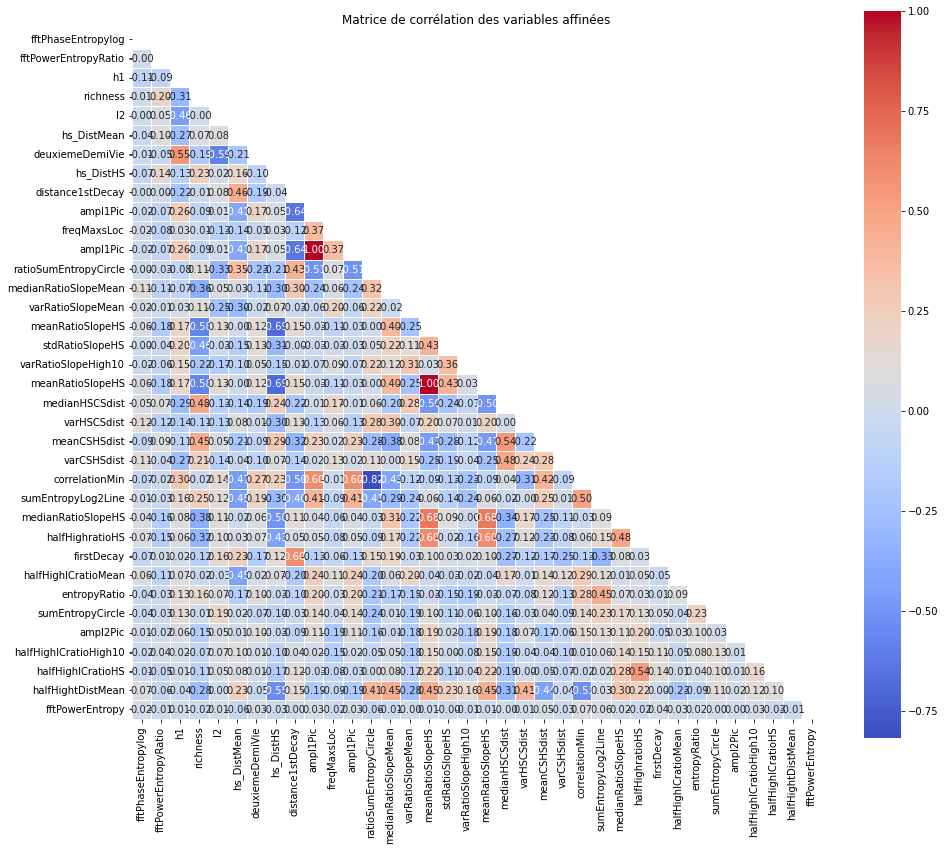

In [25]:
# Créer le DataFrame de corrélations fortes à partir des résultats précédents
data = [
    ['correlationMin', 'correlationMin', 1.000000],
    ['ampl1Pic', 'ampl1Pic', 1.000000],
    ['meanRatioSlopeHS', 'meanRatioSlopeHS', 1.000000],
    ['sumEntropyLine', 'sumEntropyLog2Line', 0.995578],
    ['correlationMin', 'correlationMedian', 0.938764],
    ['correlationMedian', 'correlationMin', 0.938764],
    ['meanRatioSlopeHS', 'meanRatioSlopeHigh10', 0.833105],
    ['meanRatioSlopeHigh10', 'meanRatioSlopeHS', 0.833105],
    ['ratioSumEntropyCircle', 'correlationMedian', -0.802546],
    ['correlationMin', 'ratioSumEntropyCircle', -0.817583],
    ['ratioSumEntropyCircle', 'correlationMin', -0.817583]
]

strong_corr_df = pd.DataFrame(data, columns=['Variable 1', 'Variable 2', 'Coefficient de corrélation'])

# Filtrer les autocorrélations (variables avec elles-mêmes)
strong_corr_df = strong_corr_df[strong_corr_df['Variable 1'] != strong_corr_df['Variable 2']]

# Appliquer la fonction de filtrage
variables_affinées = filtrer_variables_correlees(variables_selectionnees, strong_corr_df, scores_importance)

# Visualiser les résultats
plt.figure(figsize=(14, 12))
corr_affinée = df[variables_affinées].corr(method='spearman')
mask = np.triu(np.ones_like(corr_affinée, dtype=bool))
sns.heatmap(corr_affinée, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', 
            square=True, linewidths=0.5)
plt.title("Matrice de corrélation des variables affinées")
plt.tight_layout()
plt.show()

In [26]:
# Afficher la liste finale des variables
print("Liste finale des variables sélectionnées :")
for i, var in enumerate(variables_affinées, 1):
    print(f"{i}. {var}")

Liste finale des variables sélectionnées :
1. fftPhaseEntropylog
2. fftPowerEntropyRatio
3. h1
4. richness
5. l2
6. hs_DistMean
7. deuxiemeDemiVie
8. hs_DistHS
9. distance1stDecay
10. ampl1Pic
11. freqMaxsLoc
12. ampl1Pic
13. ratioSumEntropyCircle
14. medianRatioSlopeMean
15. varRatioSlopeMean
16. meanRatioSlopeHS
17. stdRatioSlopeHS
18. varRatioSlopeHigh10
19. meanRatioSlopeHS
20. medianHSCSdist
21. varHSCSdist
22. meanCSHSdist
23. varCSHSdist
24. correlationMin
25. sumEntropyLog2Line
26. medianRatioSlopeHS
27. halfHighratioHS
28. firstDecay
29. halfHighICratioMean
30. entropyRatio
31. sumEntropyCircle
32. ampl2Pic
33. halfHighICratioHigh10
34. halfHighICratioHS
35. halfHightDistMean
36. fftPowerEntropy


In [27]:
# Exporter la liste dans un fichier si nécessaire
import pandas as pd
pd.Series(variables_affinées, name="Variables_selectionnees").to_csv("variables_finales.csv", index=False)

# Créer un DataFrame avec uniquement les variables sélectionnées plus la variable cible
df_final = df[variables_affinées + ['classe']]

# Afficher les dimensions du DataFrame final
print(f"\nDimensions du DataFrame final: {df_final.shape} (lignes x colonnes)")


Dimensions du DataFrame final: (1950, 37) (lignes x colonnes)


In [28]:
df_final

,fftPhaseEntropylog,fftPowerEntropyRatio,h1,richness,l2,hs_DistMean,deuxiemeDemiVie,hs_DistHS,distance1stDecay,ampl1Pic,...,firstDecay,halfHighICratioMean,entropyRatio,sumEntropyCircle,ampl2Pic,halfHighICratioHigh10,halfHighICratioHS,halfHightDistMean,fftPowerEntropy,classe
0,16.502335,1.499193,197.098960,398,652.134338,89,0,81,6,0.087268,...,1.760028,1.015220,1.493335,4.703105,0.090190,1.192634,0.949662,36,10.315221,1
1,16.502426,1.499181,378.412473,383,565.131714,88,18,58,2,0.334851,...,1.155031,1.018879,1.495098,4.738750,0.097341,0.999258,0.984787,56,10.315221,1
2,16.502182,1.499092,418.803056,197,559.482300,78,24,74,2,0.584826,...,1.370036,1.021338,1.412033,4.677867,0.367452,1.012300,1.246312,40,10.315221,0
3,16.502701,1.499045,106.094298,329,703.959351,84,0,77,2,0.319262,...,1.228040,0.972465,1.482822,4.714244,0.220390,0.919885,0.947449,44,10.315221,1
4,16.502007,1.499155,180.133284,355,650.240295,92,0,80,3,0.263853,...,1.299150,0.974358,1.434745,4.675700,0.184075,1.014483,0.912544,46,10.315221,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1945,16.502396,1.499158,222.746493,349,617.609741,75,0,76,2,0.480313,...,1.407297,1.024144,1.379537,4.666941,0.127427,0.958188,0.967814,41,10.315221,1
1946,16.501816,1.499246,224.873298,273,631.314819,70,0,70,2,0.437027,...,1.154733,1.036284,1.425161,4.698375,0.345009,0.916556,1.052466,47,10.315221,1
1947,16.502537,1.499199,221.088218,205,653.303345,84,0,84,2,0.339188,...,1.458910,0.991995,1.380501,4.695537,0.134911,1.108540,0.939666,40,10.315221,0
1948,16.502213,1.499193,461.116037,411,546.751587,67,29,63,2,0.332769,...,1.140661,1.011185,1.539778,4.677775,0.390871,0.996665,0.968097,30,10.315221,1


In [34]:
dtf = df_final

In [30]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# Division de la base de données en train et en test
X = dtf.drop('classe', axis=1)
y = dtf['classe']

In [31]:
from sklearn.model_selection import train_test_split
# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
# Appliquer le Normalisation sur les variables quantitatives de l'ensemble d'entraînement
scaler = MinMaxScaler()

dtf_train = scaler.fit_transform(X_train)


# Créer un DataFrame avec les variables quantitatives mises à l'échelle
dtf_train_scaled = pd.DataFrame(dtf_train, columns=X_train.columns).reset_index(drop=True)
dtf_train_scaled

,fftPhaseEntropylog,fftPowerEntropyRatio,h1,richness,l2,hs_DistMean,deuxiemeDemiVie,hs_DistHS,distance1stDecay,ampl1Pic,...,halfHighratioHS,firstDecay,halfHighICratioMean,entropyRatio,sumEntropyCircle,ampl2Pic,halfHighICratioHigh10,halfHighICratioHS,halfHightDistMean,fftPowerEntropy
0,0.519779,0.573584,0.327571,0.368201,0.574010,0.818182,0.000000,0.682243,0.04,0.309406,...,0.263705,0.137443,0.676337,0.705458,0.527552,0.595149,0.239960,0.223074,0.385321,1.0
1,0.578343,0.677778,0.496864,0.317992,0.413399,0.600000,0.446429,0.570093,0.00,0.288051,...,0.222393,0.163426,0.753290,0.795868,0.201445,0.219358,0.139823,0.277595,0.403670,1.0
2,0.355802,0.411111,0.207756,0.377964,0.574435,0.763636,0.000000,0.822430,0.00,0.467891,...,0.060514,0.396518,0.687555,0.785128,0.358401,0.073760,0.102981,0.167142,0.311927,1.0
3,0.461216,0.806917,0.237065,0.467225,0.573372,0.736364,0.000000,0.514019,0.00,0.311172,...,0.100181,0.136108,0.657119,0.527986,0.151987,0.246243,0.188866,0.193135,0.495413,1.0
4,0.355802,0.177778,0.413989,0.486750,0.519728,0.618182,0.000000,0.663551,0.00,0.506105,...,0.126253,0.215412,0.766795,0.783242,0.375339,0.125824,0.156371,0.222896,0.284404,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1555,0.707183,0.620752,0.320629,0.543933,0.645956,0.718182,0.000000,0.757009,0.00,0.344330,...,0.137133,0.143189,0.666511,0.681706,0.260614,0.268901,0.126728,0.293833,0.412844,1.0
1556,0.590056,0.611111,0.216691,0.475593,0.549065,0.827273,0.000000,0.794393,0.20,0.102740,...,0.095909,0.323512,0.679471,0.325547,0.090108,0.091446,0.164695,0.181816,0.449541,1.0
1557,0.519779,0.684695,0.440570,0.209205,0.519498,0.627273,0.000000,0.626168,0.00,0.334866,...,0.089408,0.167004,0.719198,0.252261,0.198509,0.065716,0.101947,0.231179,0.422018,1.0
1558,0.262100,0.377778,0.237866,0.386332,0.606512,0.672727,0.000000,0.560748,0.00,0.371191,...,0.139053,0.148687,0.702406,0.616884,0.241192,0.076276,0.250503,0.362963,0.440367,1.0


In [33]:
scaler = MinMaxScaler()

dtf_test = scaler.fit_transform(X_test)


# Créer un DataFrame avec les variables quantitatives mises à l'échelle
dtf_test_scaled = pd.DataFrame(dtf_test, columns=X_test.columns).reset_index(drop=True)
dtf_test_scaled

,fftPhaseEntropylog,fftPowerEntropyRatio,h1,richness,l2,hs_DistMean,deuxiemeDemiVie,hs_DistHS,distance1stDecay,ampl1Pic,...,halfHighratioHS,firstDecay,halfHighICratioMean,entropyRatio,sumEntropyCircle,ampl2Pic,halfHighICratioHigh10,halfHighICratioHS,halfHightDistMean,fftPowerEntropy
0,0.768116,0.628404,0.344103,0.495455,0.591233,0.657407,0.000000,0.757576,0.000000,0.542644,...,0.078623,0.179962,0.843562,0.755755,0.260542,0.257081,0.297200,0.285134,0.349515,1.0
1,0.507246,0.638889,0.395761,0.209091,0.584119,0.666667,0.000000,0.393939,0.272727,0.158269,...,0.141364,0.337906,0.807718,0.488649,0.088299,0.306938,0.205695,0.198665,0.728155,1.0
2,0.637681,0.680556,0.424663,0.546970,0.606948,0.675926,0.000000,0.717172,0.000000,0.463186,...,0.032575,0.226244,0.786953,0.639398,0.278955,0.148852,0.199650,0.195178,0.330097,1.0
3,0.443805,0.805556,0.530194,0.515152,0.656288,0.657407,0.000000,0.838384,0.000000,0.500525,...,0.023021,0.242921,0.817213,0.745062,0.121758,0.293653,0.258358,0.156762,0.339806,1.0
4,0.260870,0.619758,0.550160,0.357576,0.623411,0.685185,0.000000,0.757576,0.000000,0.512835,...,0.115120,0.166977,0.817132,0.754109,0.132449,0.367559,0.196820,0.245096,0.339806,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,0.608696,0.447849,0.869992,0.551515,0.360518,0.592593,0.474576,0.606061,0.000000,0.358611,...,0.102668,0.108643,0.811816,0.916623,0.150663,0.528689,0.168021,0.291877,0.300971,1.0
386,0.623188,0.578091,0.810432,0.415152,0.413585,0.601852,0.406780,0.686869,0.000000,0.258706,...,0.004232,0.096607,0.839862,0.437587,0.203326,0.143406,0.204707,0.158373,0.262136,1.0
387,0.666667,0.930556,0.548361,0.234848,0.603830,0.759259,0.000000,0.757576,0.090909,0.232685,...,0.181487,0.164175,0.811167,0.377993,0.137794,0.395927,0.198303,0.353384,0.310680,1.0
388,0.318841,0.689202,0.745700,0.618182,0.377603,0.648148,0.423729,0.737374,0.000000,0.462836,...,0.088375,0.150052,0.821210,0.888796,0.146704,0.377766,0.267382,0.210310,0.242718,1.0


In [35]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

In [38]:
# Lasso Regression (L1 regularization)
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(dtf_train_scaled, y_train)
lasso_coef = lasso.coef_

In [42]:
# Create a table with variable names and Lasso coefficients
var_names = dtf_train_scaled.columns
coef_dict = {var_names[i]: lasso_coef[i] for i in range(len(var_names))}
coef_df = pd.DataFrame.from_dict(coef_dict, orient='index', columns=['Lasso Coefficient'])
print(coef_df)

                       Lasso Coefficient
fftPhaseEntropylog              0.146085
fftPowerEntropyRatio            0.152542
h1                              0.248972
richness                       -0.235942
l2                              0.327352
hs_DistMean                    -0.288545
deuxiemeDemiVie                 0.184130
hs_DistHS                      -0.509836
distance1stDecay               -0.134273
ampl1Pic                       -0.052572
freqMaxsLoc                    -0.024711
ratioSumEntropyCircle          -0.332778
medianRatioSlopeMean           -0.000000
varRatioSlopeMean              -0.143671
meanRatioSlopeHS                0.002290
stdRatioSlopeHS                 0.000000
varRatioSlopeHigh10            -0.114192
medianHSCSdist                  0.216449
varHSCSdist                     0.496198
meanCSHSdist                    0.152406
varCSHSdist                    -0.000000
correlationMin                  0.281408
sumEntropyLog2Line              0.151464
medianRatioSlope

In [44]:
# Get the Lasso-selected features
lasso_selected_features = np.where(lasso_coef != 0)[0]
print("Lasso-selected features:")
print(dtf_train_scaled.columns[lasso_selected_features])

Lasso-selected features:
Index(['fftPhaseEntropylog', 'fftPowerEntropyRatio', 'h1', 'richness', 'l2',
       'hs_DistMean', 'deuxiemeDemiVie', 'hs_DistHS', 'distance1stDecay',
       'ampl1Pic', 'freqMaxsLoc', 'ampl1Pic', 'ratioSumEntropyCircle',
       'varRatioSlopeMean', 'meanRatioSlopeHS', 'varRatioSlopeHigh10',
       'meanRatioSlopeHS', 'medianHSCSdist', 'varHSCSdist', 'meanCSHSdist',
       'correlationMin', 'sumEntropyLog2Line', 'halfHighratioHS',
       'entropyRatio', 'sumEntropyCircle', 'ampl2Pic',
       'halfHighICratioHigh10'],
      dtype='object')


In [45]:
# Random Forest feature importance
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(dtf_train_scaled, y_train)
rf_feature_importances = rf.feature_importances_

# Get the Random Forest-selected features
selector = SelectFromModel(rf, prefit=True)
rf_selected_features = np.where(selector.get_support())[0]
print("Random Forest-selected features:")
print(dtf_train_scaled.columns[rf_selected_features])

Random Forest-selected features:
Index(['h1', 'richness', 'l2', 'hs_DistMean', 'hs_DistHS',
       'ratioSumEntropyCircle', 'medianRatioSlopeMean', 'meanRatioSlopeHS',
       'meanRatioSlopeHS', 'varHSCSdist', 'meanCSHSdist', 'varCSHSdist',
       'correlationMin', 'sumEntropyLog2Line', 'halfHighratioHS', 'firstDecay',
       'halfHighICratioMean', 'sumEntropyCircle'],
      dtype='object')


In [46]:

liste1 = ['fftPhaseEntropylog', 'fftPowerEntropyRatio', 'h1', 'richness', 'l2',
       'hs_DistMean', 'deuxiemeDemiVie', 'hs_DistHS', 'distance1stDecay',
       'ampl1Pic', 'freqMaxsLoc', 'ampl1Pic', 'ratioSumEntropyCircle',
       'varRatioSlopeMean', 'meanRatioSlopeHS', 'varRatioSlopeHigh10',
       'meanRatioSlopeHS', 'medianHSCSdist', 'varHSCSdist', 'meanCSHSdist',
       'correlationMin', 'sumEntropyLog2Line', 'halfHighratioHS',
       'entropyRatio', 'sumEntropyCircle', 'ampl2Pic',
       'halfHighICratioHigh10']
liste2 = ['h1', 'richness', 'l2', 'hs_DistMean', 'hs_DistHS',
       'ratioSumEntropyCircle', 'medianRatioSlopeMean', 'meanRatioSlopeHS',
       'meanRatioSlopeHS', 'varHSCSdist', 'meanCSHSdist', 'varCSHSdist',
       'correlationMin', 'sumEntropyLog2Line', 'halfHighratioHS', 'firstDecay',
       'halfHighICratioMean', 'sumEntropyCircle']

intersection = list(set(liste1).intersection(set(liste2)))
print(intersection)  

['richness', 'hs_DistMean', 'halfHighratioHS', 'meanCSHSdist', 'h1', 'ratioSumEntropyCircle', 'meanRatioSlopeHS', 'l2', 'varHSCSdist', 'sumEntropyCircle', 'sumEntropyLog2Line', 'correlationMin', 'hs_DistHS']


In [50]:
X_var = ['richness', 'hs_DistMean', 'halfHighratioHS', 'meanCSHSdist', 'h1', 'ratioSumEntropyCircle', 'meanRatioSlopeHS', 'l2', 'varHSCSdist', 'sumEntropyCircle', 'sumEntropyLog2Line', 'correlationMin', 'hs_DistHS']

In [51]:
dtf_train_scaled = dtf_train_scaled[X_var]
dtf_test_scaled = dtf_test_scaled[X_var]

In [58]:
param_grid = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
             'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
             'max_depth':[2,3,4,5,6,7],                             #maximum depth of the tree
             'min_samples_split':[2,4,6,8,10,20,40,60,100],         #sets the minimum number of samples to split
             'min_samples_leaf':[1,3,5,7,9],                        #the minimum number of samples to form a leaf
             'max_features':[2,3,4,5,6,7],                          #square root of features is usually a good starting point
             'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}            #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, precision_recall_curve
from sklearn.preprocessing import StandardScaler


# 1. Validation croisée avec hyperparamètres par défaut
def evaluate_model_with_cross_validation(X, y, cv=5):
    # Initialiser le modèle
    gb_model = GradientBoostingClassifier(random_state=42)
    
    # Calculer les scores avec validation croisée
    cv_scores = cross_val_score(gb_model, X, y, cv=cv, scoring='accuracy')
    
    print(f"Validation croisée ({cv} folds):")
    print(f"Précision moyenne: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")
    print(f"Scores individuels: {cv_scores}")
    
    # Retourner le modèle
    return gb_model

# 2. Recherche d'hyperparamètres avec GridSearchCV
def tune_model_hyperparameters(X, y, cv=5):
    # Définir la grille d'hyperparamètres
    param_grid = {
        'n_estimators': [100,250,500,750,1000,1250,1500,1750],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [2,3,4,5,6,7],
        'min_samples_split': [2, 5, 10],
        'subsample': [0.8, 1.0]
    }
    
    # Initialiser le modèle
    gb_model = GradientBoostingClassifier(random_state=42)
    
    # Initialiser GridSearchCV
    grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, 
                               cv=cv, scoring='accuracy', n_jobs=-1, verbose=1)
    
    # Exécuter la recherche d'hyperparamètres
    grid_search.fit(X, y)
    
    # Afficher les meilleurs paramètres
    print("Meilleurs hyperparamètres:")
    print(grid_search.best_params_)
    print(f"Meilleure précision CV: {grid_search.best_score_:.4f}")
    
    # Retourner le meilleur modèle
    return grid_search.best_estimator_

# 3. Entraîner le modèle final et évaluer les performances
def train_and_evaluate_model(X_train, X_test, y_train, y_test, model):
    # Entraîner le modèle
    model.fit(X_train, y_train)
    
    # Faire des prédictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:,1]
    
    # Calculer les métriques de performance
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted')
    rec = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    try:
        auc = roc_auc_score(y_test, y_pred_proba)
    except:
        auc = None
    
    # Afficher les métriques
    print("\nPerformances du modèle:")
    print(f"Accuracy: {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall: {rec:.4f}")
    print(f"F1 Score: {f1:.4f}")
    if auc:
        print(f"AUC-ROC: {auc:.4f}")
    
    # Afficher la matrice de confusion
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=np.unique(y), yticklabels=np.unique(y))
    plt.title('Matrice de confusion')
    plt.xlabel('Prédit')
    plt.ylabel('Réel')
    plt.show()
    
    # Afficher le rapport de classification
    print("\nRapport de classification:")
    print(classification_report(y_test, y_pred))
    
    # Tracer la courbe ROC
    if len(np.unique(y_test)) == 2:
        plt.figure(figsize=(8, 6))
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.plot(fpr, tpr, label=f'AUC = {auc:.4f}')
        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlabel('Taux de faux positifs')
        plt.ylabel('Taux de vrais positifs')
        plt.title('Courbe ROC')
        plt.legend()
        plt.show()
    
    # Importance des caractéristiques
    plt.figure(figsize=(12, 6))
    feature_importance = pd.Series(model.feature_importances_, index=dtf_train_scaled.columns)
    feature_importance.nlargest(20).sort_values().plot(kind='barh')
    plt.title('Importance des caractéristiques')
    plt.tight_layout()
    plt.show()
    
    return model, {'accuracy': acc, 'precision': prec, 'recall': rec, 'f1': f1, 'auc': auc}

# Exécuter tout le processus
# Étape 1: validation croisée initiale
print("Étape 1: Validation croisée initiale")
gb_model = evaluate_model_with_cross_validation(dtf_train_scaled, y_train, cv=5)

# Étape 2: recherche d'hyperparamètres (peut être longue, décommentez si nécessaire)
print("\nÉtape 2: Recherche d'hyperparamètres")
best_model = tune_model_hyperparameters(dtf_train_scaled, y_train, cv=5)

gb_model = GradientBoostingClassifier(random_state=42)
grid_search = GridSearchCV(gb_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(dtf_train_scaled, y_train)
best_model = grid_search.best_estimator_
print("Meilleurs hyperparamètres:", grid_search.best_params_)
print(f"Meilleure précision CV: {grid_search.best_score_:.4f}")

# Étape 3: Entraînement et évaluation finale
print("\nÉtape 3: Évaluation finale du modèle")
final_model, metrics = train_and_evaluate_model(dtf_train_scaled, dtf_test_scaled, y_train, y_test, best_model)

Étape 1: Validation croisée initiale
Validation croisée (5 folds):
Précision moyenne: 0.7212 ± 0.0161
Scores individuels: [0.74038462 0.69551282 0.71153846 0.72435897 0.73397436]

Étape 2: Recherche d'hyperparamètres
Fitting 5 folds for each of 864 candidates, totalling 4320 fits
Meilleurs hyperparamètres:
{'learning_rate': 0.1, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 1000, 'subsample': 0.8}
Meilleure précision CV: 0.7449


In [33]:
X_names = ['correlationMin','lineHSStdToCircleHS','l2','medianHSCSdist','coronaLength',
           'meanRatioSlopeHigh10','variance','medianRatioSlopeHigh10','meanRatioSlopeHS',
           'ecartMaxRatiosZones45','hs_DistHS','varHSCSdist','hs_DistHigh10',
          'halfHightDistHigh10','mean','meanStream','ratioSumEntropyCircle']

--- model used ---
RandomForestClassifier(criterion='entropy', random_state=0)


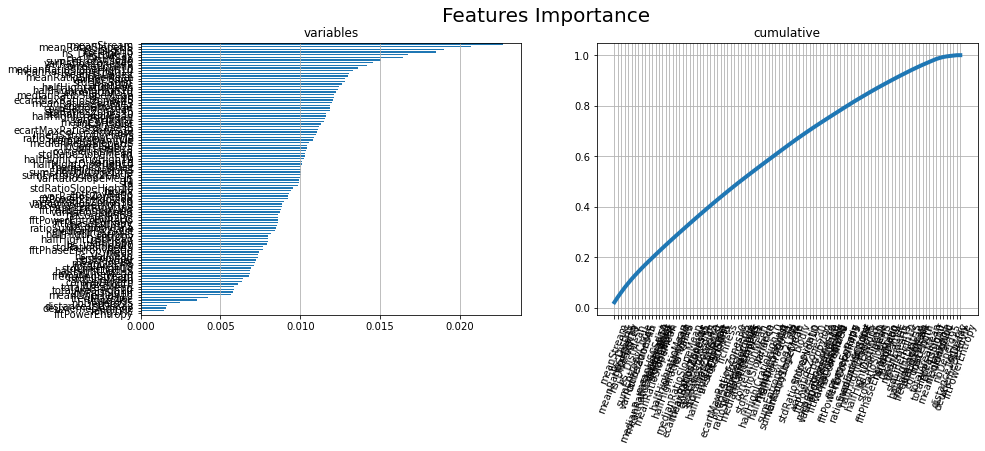

In [34]:
model = ensemble.RandomForestClassifier(n_estimators=100, criterion="entropy", random_state=0)

feat_imp = features_importance(X=dtf_train.drop("Y",axis=1).values, y=dtf_train["Y"].values, 
                               X_names=dtf_train.drop("Y",axis=1).columns.tolist(), 
                               model=model, task="classification", figsize=(15,5))

In [35]:
X_train = dtf_train[X_names].values
y_train = dtf_train["Y"].values

In [37]:
# Calcul des poids des échantillons
sample_weights = np.where(y_train == 0, 0.1, 0.9)  # Poids plus élevés pour la classe minoritaire

# Création et entraînement du modèle GradientBoostingClassifier
model = ensemble.GradientBoostingClassifier(random_state=42)
model.fit(X_train, y_train, sample_weight=sample_weights)

GradientBoostingClassifier(random_state=42)

Shape: (1560, 17)
-----------------
correlationMin --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
lineHSStdToCircleHS --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
l2 --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
medianHSCSdist --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
coronaLength --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
meanRatioSlopeHigh10 --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
variance --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
medianRatioSlopeHigh10 --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
meanRatioSlopeHS --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
ecartMaxRatiosZones45 --> Type:num | Nas: 0(0%) | Min-Max: (0)-(0)
hs_DistHS --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
varHSCSdist --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
hs_DistHigh10 --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
halfHightDistHigh10 --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
mean --> Type:num | Nas: 0(0%) | Min-Max: (0)-(1)
meanStream --> Type:num | Nas: 0(0%) | Min-Max: (0)-(0)
ratioSumEntrop

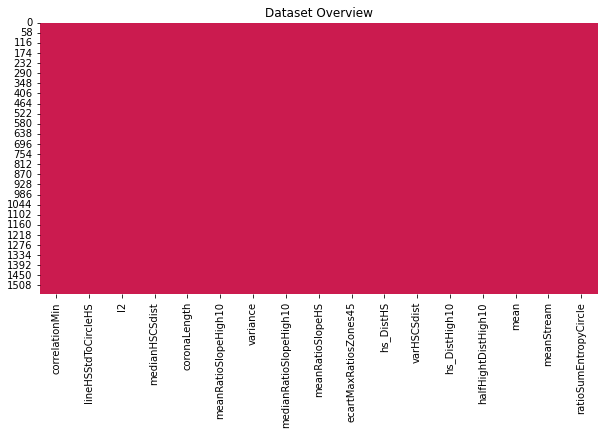

 Categerocial   Numerical/DateTime   NaN 


In [36]:
dtf_overview(dtf_train[X_names])

In [37]:
param_dic = {'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],      #weighting factor for the corrections by new trees when added to the model
             'n_estimators':[100,250,500,750,1000,1250,1500,1750],  #number of trees added to the model
             'max_depth':[2,3,4,5,6,7],                             #maximum depth of the tree
             'min_samples_split':[2,4,6,8,10,20,40,60,100],         #sets the minimum number of samples to split
             'min_samples_leaf':[1,3,5,7,9],                        #the minimum number of samples to form a leaf
             'max_features':[2,3,4,5,6,7],                          #square root of features is usually a good starting point
             'subsample':[0.7,0.75,0.8,0.85,0.9,0.95,1]}            #the fraction of samples to be used for fitting the individual base learners. Values lower than 1 generally lead to a reduction of variance and an increase in bias.

--- RandomSearch ---
Best Model parameters: {'subsample': 0.95, 'n_estimators': 1000, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 2, 'max_depth': 7, 'learning_rate': 0.15}
Best Model accuracy: 0.72

--- Kfold Validation ---
accuracy mean - base model: 0.7  --> best model: 1
precision mean - base model: 0.7  --> best model: 1
recall mean - base model: 0.66  --> best model: 1
f1 mean - base model: 0.68  --> best model: 1


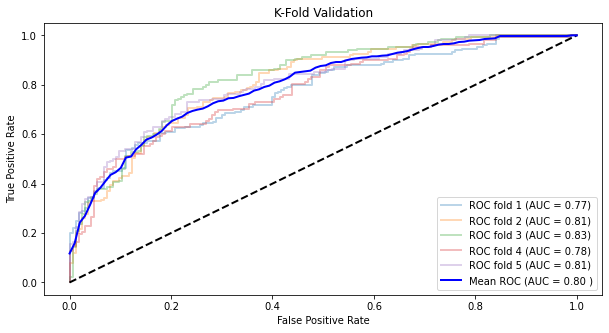


--- Threshold Selection ---
accuracy --> best threshold: 0.8
precision --> best threshold: 0.9
recall --> best threshold: 0.1
f1 --> best threshold: 0.1


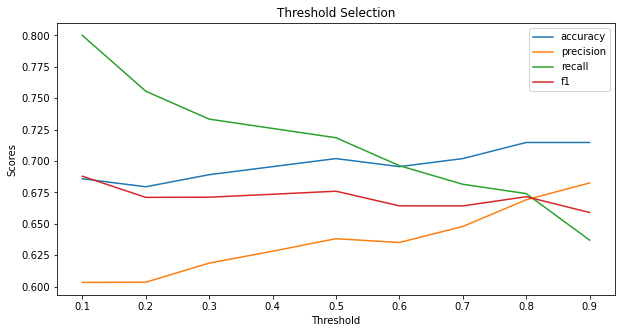

In [38]:
model = ensemble.GradientBoostingClassifier()
model = tune_classif_model(X_train, y_train, model, param_dic, scoring="accuracy", 
                           searchtype="RandomSearch", n_iter=300, cv=5, figsize=(10,5))

In [39]:
X_test = dtf_test[X_names].values
y_test = dtf_test["Y"].values


In [40]:
model, predicted_prob, predicted = fit_ml_classif(model, X_train, y_train, X_test, threshold=0.85)


Accuracy (overall correct predictions): 0.74
Auc: 0.83
Recall (all 1s predicted right): 0.66
Precision (confidence when predicting a 1): 0.82
F1 score: 0.73
Detail:
              precision    recall  f1-score   support

           0       0.68      0.83      0.75       182
           1       0.82      0.66      0.73       208

    accuracy                           0.74       390
   macro avg       0.75      0.74      0.74       390
weighted avg       0.75      0.74      0.74       390



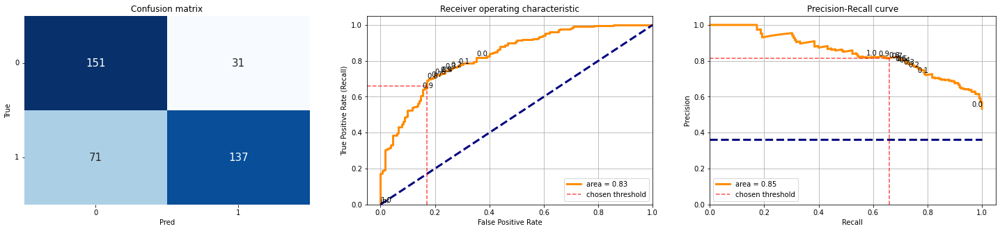

In [41]:
evaluate_classif_model(y_test, predicted, predicted_prob, figsize=(25,5))

True: 0 --> Pred: 0 | Prob: 0.02


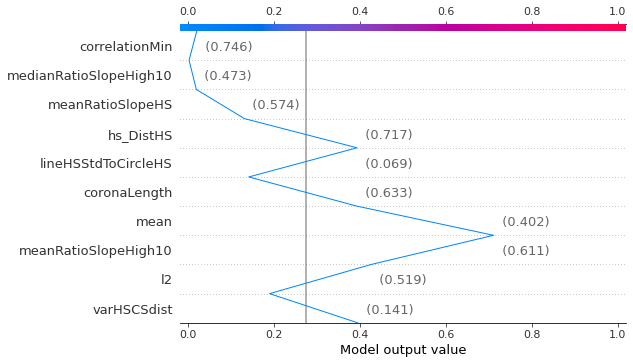

In [42]:
i = 4
print("True:", y_test[i], "--> Pred:", int(predicted[i]), "| Prob:", np.round(np.max(predicted_prob[i]), 2))

explainer_shap(model, X_names, X_instance=X_test[i], X_train=None, task="classification", top=10)

In [43]:
model2d = ensemble.GradientBoostingClassifier()
model2d.set_params(**{'subsample': 0.9, 'n_estimators': 100, 'min_samples_split': 60, 'min_samples_leaf': 3, 'max_features': 3, 'max_depth': 3, 'learning_rate': 0.15})


GradientBoostingClassifier(learning_rate=0.15, max_features=3,
                           min_samples_leaf=3, min_samples_split=60,
                           subsample=0.9)

--- reducing dimensions to 2 ---
--- fitting 2d model ---
--- plotting test set ---


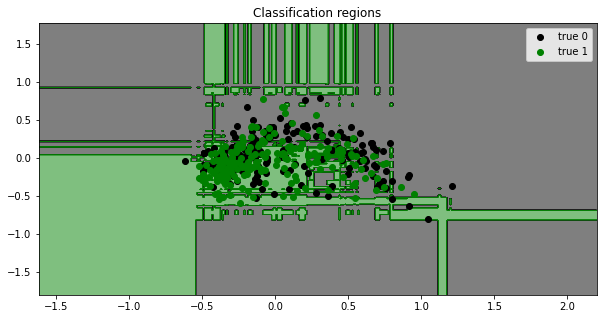

In [44]:
plot2d_classif_model(X_train, y_train, X_test, y_test, model2d, annotate=False, figsize=(10,5))

--- reducing dimensions to 2 ---
--- fitting 2d model ---
--- plotting test set ---


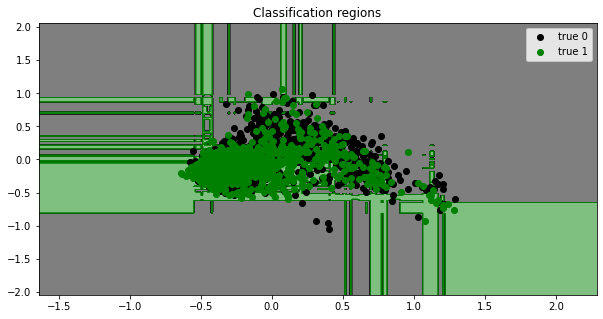

In [45]:
plot2d_classif_model(X_train, y_train,X_train, y_train, model2d, annotate=False, figsize=(10,5))

In [46]:
def Recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def Precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def F1(y_true, y_pred):
    precision = Precision(y_true, y_pred)
    recall = Recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))


In [47]:
len(X_names)

17

In [48]:
# Deep neural network with fully connected layers
n_features = 17
model = models.Sequential(name="DeepNN", layers=[
    ### (layer input) & hidden layer 1
    layers.Dense(name="h1", input_dim=n_features, units=int(round((n_features+1)/2)), activation='relu'),
    layers.Dropout(name="drop1", rate=0.2),
    ### hidden layer 2
    layers.Dense(name="h2", units=int(round((n_features+1)/4)), activation='relu'),
    layers.Dropout(name="drop2", rate=0.2),
    ### layer output
    layers.Dense(name="output", units=1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy',F1])

model.summary()

Model: "DeepNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 h1 (Dense)                  (None, 9)                 162       
                                                                 
 drop1 (Dropout)             (None, 9)                 0         
                                                                 
 h2 (Dense)                  (None, 4)                 40        
                                                                 
 drop2 (Dropout)             (None, 4)                 0         
                                                                 
 output (Dense)              (None, 1)                 5         
                                                                 
Total params: 207
Trainable params: 207
Non-trainable params: 0
_________________________________________________________________


2024-08-06 13:40:55.017969: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


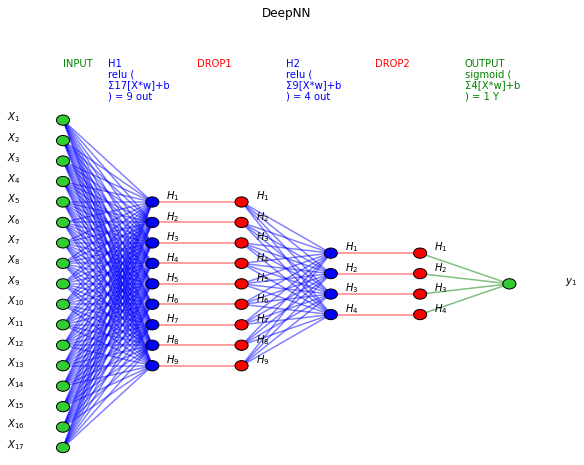

In [49]:
visualize_nn(model, description=True, figsize=(10,8))


In [50]:
X_test = dtf_test[X_names].values
y_test = dtf_test["Y"].values


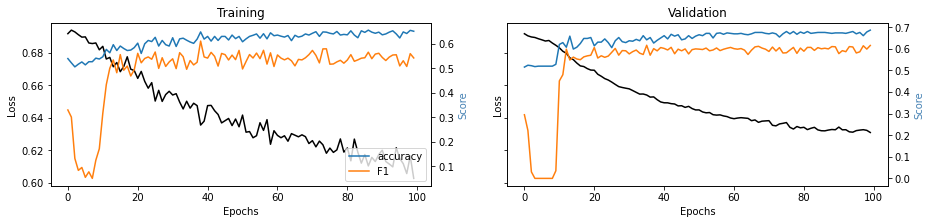

13/13 [==============================] - 0s 1ms/step


In [51]:
model, predicted_prob, predicted = fit_dl_classif(X_train, y_train, X_test, model, 
                                                  batch_size=32, epochs=100, threshold=0.30)

Accuracy (overall correct predictions): 0.57
Auc: 0.75
Recall (all 1s predicted right): 0.98
Precision (confidence when predicting a 1): 0.55
F1 score: 0.71
Detail:
              precision    recall  f1-score   support

           0       0.78      0.10      0.18       182
           1       0.55      0.98      0.71       208

    accuracy                           0.57       390
   macro avg       0.67      0.54      0.44       390
weighted avg       0.66      0.57      0.46       390



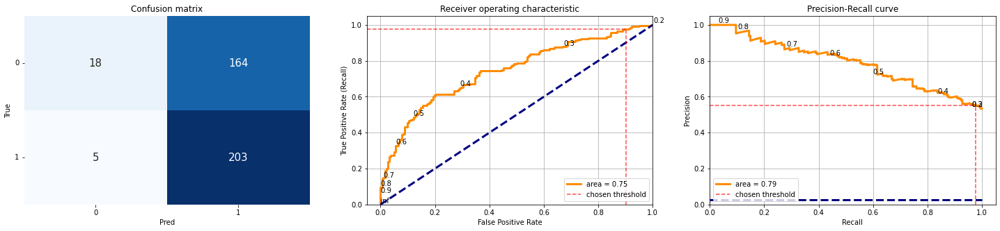

In [52]:
evaluate_classif_model(y_test, predicted, predicted_prob, figsize=(25,5))

True: 0 --> Pred: 1 | Prob: 0.38
Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


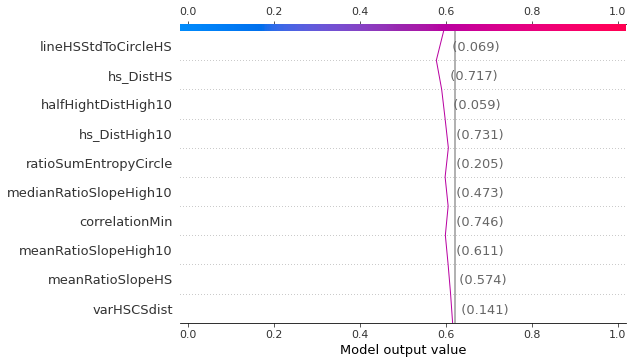

In [53]:
print("True:", y_test[i], "--> Pred:", int(predicted[i]), "| Prob:", np.round(np.max(predicted_prob[i]), 2))

explainer_shap(model, X_names, X_instance=X_test[i], X_train=X_train, task="classification", top=10)

In [54]:
model2d = models.Sequential()
### layer 1
model2d.add(layers.Dense(input_dim=2, units=int(round((17+1)/2)), kernel_initializer='uniform', activation='relu'))
model2d.add(layers.Dropout(rate=0.2))
### layer 2
model2d.add(layers.Dense(units=int(round((17+1)/2)), kernel_initializer='uniform', activation='relu'))
model2d.add(layers.Dropout(rate=0.2))
### layer output
model2d.add(layers.Dense(units=1, kernel_initializer='uniform', activation='sigmoid'))
model2d.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

--- reducing dimensions to 2 ---
--- fitting 2d model ---
49/49 [==============================] - 1s 1ms/step - loss: 0.6929 - accuracy: 0.5263
--- plotting test set ---
4297/4297 [==============================] - 5s 999us/step


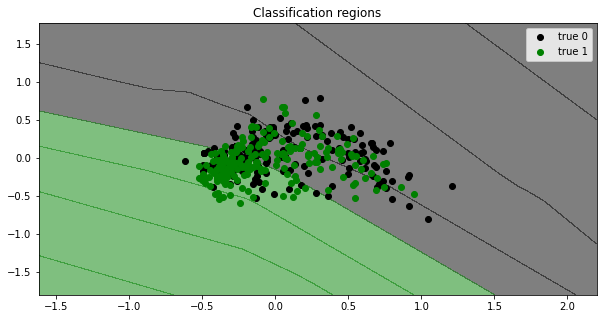

In [55]:
plot2d_classif_model(X_train, y_train, X_test, y_test, model2d, annotate=False, figsize=(10,5))

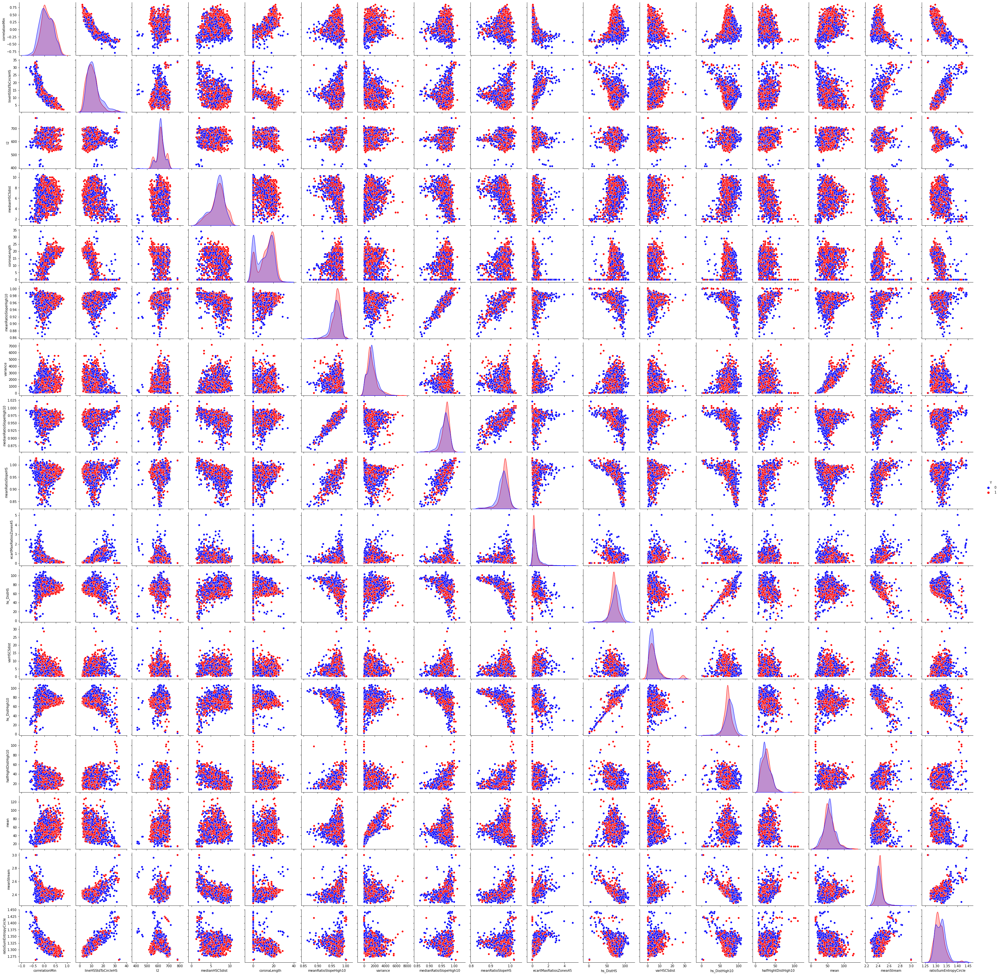

In [56]:
sns.pairplot(dtf, vars=X_names, hue="Y", palette=["blue","red"])

In [63]:
import pandas as pd

# Supposons que votre DataFrame s'appelle df et que la colonne de classe s'appelle 'class'
# Remplacez 'class' par le nom de la colonne correspondant à vos classes
classe_counts = dtf['Y'].value_counts()

print(classe_counts)

# Si vous voulez spécifiquement accéder aux nombres de chaque classe
num_classe_0 = classe_counts.get(0, 0)  # Nombre d'individus dans la classe 0
num_classe_1 = classe_counts.get(1, 0)  # Nombre d'individus dans la classe 1

print(f"Nombre d'individus dans la classe 0: {num_classe_0}")
print(f"Nombre d'individus dans la classe 1: {num_classe_1}")

0    2565
1     950
Name: Y, dtype: int64
Nombre d'individus dans la classe 0: 2565
Nombre d'individus dans la classe 1: 950
